<a href="https://colab.research.google.com/github/YunSeoHwan/My-own-study-repository/blob/main/ML_TeamProject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# import

In [3]:
import pandas as pd
import numpy as np
import random
import collections
import graphviz # tree 시각화
import sklearn.metrics as mt # 성능지표를 계산하기 위해 import
import matplotlib.font_manager as fm

# 시각화 라이브러리
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import mglearn

from sklearn.model_selection import GridSearchCV
from sklearn.cluster import AffinityPropagation
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import RobustScaler
from sklearn.datasets import make_blobs
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split # 학습, 테스트set 구분
from sklearn.tree import export_graphviz # tree 시각화를 위해
from sklearn.model_selection import cross_val_score, cross_validate # 교차검증
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn import metrics
from scipy import stats
from sklearn.decomposition import IncrementalPCA
from sklearn.manifold import TSNE
random.seed(2023)

import warnings
warnings.filterwarnings('ignore')

from mpl_toolkits.mplot3d import Axes3D
from sklearn import datasets
from sklearn.manifold import TSNE
from sklearn.pipeline import make_pipeline

In [2]:
# 노트북이 코랩에서 실행 중인지 체크합니다.
import os
import sys
if 'google.colab' in sys.modules and not os.path.isdir('mglearn'):
    # 사이킷런 최신 버전을 설치합니다.
    !pip install -q --upgrade scikit-learn
    # mglearn을 다운받고 압축을 풉니다.
    !wget -q -O mglearn.tar.gz https://bit.ly/mglearn-tar-gz
    !tar -xzf mglearn.tar.gz

# Data Load

In [ ]:
# CustomerID : 고유 ID
# City : 도시
# Zip Code : 우편번호
# Latitude : 고객의 주 거주지 위도.
# Longitude : 고객의 기본 거주지의 경도입니다.
# Gender : 성별
# Senior Citizen : 고객이 65세 이상인지 표시: 예, 아니오
# Partner : 고객에게 파트너가 있는지 표시: 예, 아니오
# Dependents : 고객이 부양 가족과 함께 살고 있는지 여부를 나타냅니다: 예, 아니요.
# Tenure Months : 위에서 지정한 분기 말까지 고객이 회사에 근무한 총 개월 수를 나타냅니다.
# Phone Service : 집 전화 서비스 가입여부 : 예, 아니오
# Multiple Lines : 고객이 회사와 여러 전화 회선에 가입했는지 여부를 나타냅니다. 예, 아니오
# Internet Service : No, DSL, Fiber Optic, Cable 회사에서 인터넷 서비스에 가입했는지 여부를 나타냅니다.
# Online Security : 추가 온라인 보안 서비스에 가입했는지 표시: 예, 아니오
# Online Backup : 추가 온라인 백업 서비스에 가입되어 있는지 표시: 예, 아니오
# Device Protection : 인터넷 장비에 대한 추가 기기 보호 요금제 가입 여부 표시: 예, 아니요
# Tech Support : 대기 시간이 단축된 회사의 추가 기술 지원 계획에 고객이 가입했는지 표시: 예, 아니요
# Streaming TV : 고객이 인터넷 서비스를 사용하여 타사 공급자의 TV 프로그램을 스트리밍하는지 여부를 나타냅니다. 예, 아니요. 회사는 이 서비스에 대해 추가 요금을 부과하지 않습니다.
# Streaming Movies : 고객이 타사 공급자의 영화를 스트리밍하기 위해 인터넷 서비스를 사용하는지 여부를 나타냅니다. 예, 아니요. 회사는 이 서비스에 대해 추가 요금을 부과하지 않습니다.
# Contract : 고객의 현재 계약 유형을 나타냅니다: 월 단위, 1년, 2년.
# Paperless Billing : 인터넷 영수증. Yes, No
# Payment Method : 고객이 결제하는 방법을 나타냅니다: 은행인출, 신용카드, 우편수표
# Monthly Charge : 회사에서 제공하는 모든 서비스에 대한 고객의 현재 월 총 요금을 나타냅니다.
# Total Charges : 위에서 지정한 분기 말까지 계산된 고객의 총 요금을 나타냅니다.
# Churn Label : 예 = 고객이 이번 분기에 회사를 떠났습니다. 아니요 = 고객이 회사에 남아 있습니다. 이탈 가치와 직접적인 관련이 있습니다.
# Churn Value : 1 = 고객이 이번 분기에 회사를 떠났습니다. 0 = 고객이 회사에 남아 있습니다. Churn Label과 직접 관련이 있습니다.
# Churn Score : 예측 도구 IBM SPSS Modeler를 사용하여 계산되는 0-100 사이의 값입니다. 이 모델은 이탈을 유발하는 것으로 알려진 여러 요인을 통합합니다. 점수가 높을수록 고객이 이탈할 가능성이 높아집니다.
# CLTV : 고객평생가치. 예상 CLTV는 회사 공식과 기존 데이터를 사용하여 계산됩니다. 가치가 높을수록 고객의 가치가 높아집니다. 가치가 높은 고객은 이탈 여부를 모니터링해야 합니다.
# Churn Reason : 회사를 떠나는 고객의 구체적인 이유입니다. 이탈 카테고리와 직접 관련이 있습니다.

In [4]:
df = pd.read_csv('/content/drive/MyDrive/ML/Telco_customer_churn.csv')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 33 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   CustomerID         7043 non-null   object 
 1   Count              7043 non-null   int64  
 2   Country            7043 non-null   object 
 3   State              7043 non-null   object 
 4   City               7043 non-null   object 
 5   Zip Code           7043 non-null   int64  
 6   Lat Long           7043 non-null   object 
 7   Latitude           7043 non-null   float64
 8   Longitude          7043 non-null   float64
 9   Gender             7043 non-null   object 
 10  Senior Citizen     7043 non-null   object 
 11  Partner            7043 non-null   object 
 12  Dependents         7043 non-null   object 
 13  Tenure Months      7043 non-null   int64  
 14  Phone Service      7043 non-null   object 
 15  Multiple Lines     7043 non-null   object 
 16  Internet Service   7043 

In [ ]:
df.head(5)

,CustomerID,Count,Country,State,City,Zip Code,Lat Long,Latitude,Longitude,Gender,...,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Label,Churn Value,Churn Score,CLTV,Churn Reason
0,3668-QPYBK,1,United States,California,Los Angeles,90003,"33.964131, -118.272783",33.964131,-118.272783,Male,...,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,1,86,3239,Competitor made better offer
1,9237-HQITU,1,United States,California,Los Angeles,90005,"34.059281, -118.30742",34.059281,-118.307420,Female,...,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,1,67,2701,Moved
2,9305-CDSKC,1,United States,California,Los Angeles,90006,"34.048013, -118.293953",34.048013,-118.293953,Female,...,Month-to-month,Yes,Electronic check,99.65,820.5,Yes,1,86,5372,Moved
3,7892-POOKP,1,United States,California,Los Angeles,90010,"34.062125, -118.315709",34.062125,-118.315709,Female,...,Month-to-month,Yes,Electronic check,104.80,3046.05,Yes,1,84,5003,Moved
4,0280-XJGEX,1,United States,California,Los Angeles,90015,"34.039224, -118.266293",34.039224,-118.266293,Male,...,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.3,Yes,1,89,5340,Competitor had better devices


In [ ]:
df.tail(5)

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
2082,Female,20.976842,1.710730,131.408528,yes,yes,3.0,3.0,Sometimes,no,1.728139,no,1.676269,0.906247,Sometimes,Public_Transportation,Obesity_Type_III
2083,Female,21.982942,1.748584,133.742943,yes,yes,3.0,3.0,Sometimes,no,2.005130,no,1.341390,0.599270,Sometimes,Public_Transportation,Obesity_Type_III
2084,Female,22.524036,1.752206,133.689352,yes,yes,3.0,3.0,Sometimes,no,2.054193,no,1.414209,0.646288,Sometimes,Public_Transportation,Obesity_Type_III
2085,Female,24.361936,1.739450,133.346641,yes,yes,3.0,3.0,Sometimes,no,2.852339,no,1.139107,0.586035,Sometimes,Public_Transportation,Obesity_Type_III
2086,Female,23.664709,1.738836,133.472641,yes,yes,3.0,3.0,Sometimes,no,2.863513,no,1.026452,0.714137,Sometimes,Public_Transportation,Obesity_Type_III


In [4]:
# 데이터 중복
dup_data = df[df.duplicated()]
print(dup_data.shape)

(0, 33)


In [ ]:
# numerical data
# Count 변수는 1만 존재
df.describe()

,Count,Zip Code,Latitude,Longitude,Tenure Months,Monthly Charges,Churn Value,Churn Score,CLTV
count,7043.0,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000
mean,1.0,93521.964646,36.282441,-119.798880,32.371149,64.761692,0.265370,58.699418,4400.295755
std,0.0,1865.794555,2.455723,2.157889,24.559481,30.090047,0.441561,21.525131,1183.057152
min,1.0,90001.000000,32.555828,-124.301372,0.000000,18.250000,0.000000,5.000000,2003.000000
25%,1.0,92102.000000,34.030915,-121.815412,9.000000,35.500000,0.000000,40.000000,3469.000000
50%,1.0,93552.000000,36.391777,-119.730885,29.000000,70.350000,0.000000,61.000000,4527.000000
75%,1.0,95351.000000,38.224869,-118.043237,55.000000,89.850000,1.000000,75.000000,5380.500000
max,1.0,96161.000000,41.962127,-114.192901,72.000000,118.750000,1.000000,100.000000,6500.000000


In [ ]:
# categorical data
# ID, Y/N 응답 데이터 Encoding 필요
# Country, state는 unique 1개 -> drop
# Churn Reason -> drop (실제 이유 예측)
# 인터넷 서비스를 이용하는 사람 중에 다른 서비스 안쓰는 사람 비율 판단 -> Y/N로 판단 가능
df.describe(include='object')

,CustomerID,City,Lat Long,Gender,Senior Citizen,Partner,Dependents,Phone Service,Multiple Lines,Internet Service,...,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Total Charges,Churn Label,Churn Reason
count,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,...,7043,7043,7043,7043,7043,7043,7043,7043,7043,1869
unique,7043,1129,1652,2,2,2,2,2,3,3,...,3,3,3,3,3,2,4,6531,2,20
top,3668-QPYBK,Los Angeles,"33.964131, -118.272783",Male,No,No,No,Yes,No,Fiber optic,...,No,No,No,No,Month-to-month,Yes,Electronic check,20.2,No,Attitude of support person
freq,1,305,5,3555,5901,3641,5416,6361,3390,3096,...,3095,3473,2810,2785,3875,4171,2365,11,5174,192


In [38]:
# unique 컬럼 제거
df = df.drop(['Count','Country', 'State', 'Lat Long','Churn Reason'], axis=1)

KeyError: ignored

In [ ]:
# 결측지 확인
df.isnull().sum()

CustomerID              0
Count                   0
Country                 0
State                   0
City                    0
Zip Code                0
Lat Long                0
Latitude                0
Longitude               0
Gender                  0
Senior Citizen          0
Partner                 0
Dependents              0
Tenure Months           0
Phone Service           0
Multiple Lines          0
Internet Service        0
Online Security         0
Online Backup           0
Device Protection       0
Tech Support            0
Streaming TV            0
Streaming Movies        0
Contract                0
Paperless Billing       0
Payment Method          0
Monthly Charges         0
Total Charges           0
Churn Label             0
Churn Value             0
Churn Score             0
CLTV                    0
Churn Reason         5174
dtype: int64

# Data Processing

## Categorical processing

In [27]:
# 범주형 변수 표시
cat_col = df.select_dtypes(include=['object']).columns

for cat in cat_col:
  print(cat)
  print(df[cat].unique())
  print("\n")

Total Charges
['108.15' '151.65' '820.5' ... '7362.9' '346.45' '6844.5']


Churn Reason
['Competitor made better offer' 'Moved' 'Competitor had better devices'
 'Competitor offered higher download speeds'
 'Competitor offered more data' 'Price too high' 'Product dissatisfaction'
 'Service dissatisfaction' 'Lack of self-service on Website'
 'Network reliability' 'Limited range of services'
 'Lack of affordable download/upload speed' 'Long distance charges'
 'Extra data charges' "Don't know" 'Poor expertise of online support'
 'Poor expertise of phone support' 'Attitude of service provider'
 'Attitude of support person' 'Deceased' nan]




In [26]:
# Internet Service : No -> Service : No Internet Service
# No Internet Service -> No로 대체
# Yes -> 1, No -> 0
# Male -> 1, No -> 0
for col in ['Internet Service', 'Online Security', 'Online Backup', 'Device Protection', 
            'Tech Support', 'Streaming TV', 'Streaming Movies', 'Phone Service','Multiple Lines']:
    print(col, ":\n", df[col].value_counts(), "\n")

Internet Service :
 1    3096
2    2421
0    1526
Name: Internet Service, dtype: int64 

Online Security :
 0    5024
1    2019
Name: Online Security, dtype: int64 

Online Backup :
 0    4614
1    2429
Name: Online Backup, dtype: int64 

Device Protection :
 0    4621
1    2422
Name: Device Protection, dtype: int64 

Tech Support :
 0    4999
1    2044
Name: Tech Support, dtype: int64 

Streaming TV :
 0    4336
1    2707
Name: Streaming TV, dtype: int64 

Streaming Movies :
 0    4311
1    2732
Name: Streaming Movies, dtype: int64 

Phone Service :
 Series([], Name: Phone Service, dtype: int64) 

Multiple Lines :
 0    4072
1    2971
Name: Multiple Lines, dtype: int64 



In [25]:
# Binary Encoding
df['Gender'] = df['Gender'].map({'Male': 1, 'Female': 0})

for col in ['Senior Citizen', 'Partner', 'Dependents', 'Phone Service', 'Paperless Billing']:
    df[col] = df[col].map({'Yes': 1, 'No': 0})

# Service Encoding
df['Internet Service'] = df['Internet Service'].map({'No': 0, 'Fiber optic': 1, 'DSL': 2})

for col in ['Online Security', 'Online Backup', 'Device Protection',
            'Tech Support', 'Streaming TV', 'Streaming Movies']:
    df[col] = df[col].map({'Yes': 1, 'No': 0, 'No internet service': 0})

# Phone Service Encoding
df['Phone Service'] = df['Phone Service'].map({'Yes': 1, 'No': 0})
df['Multiple Lines'] = df['Multiple Lines'].map({'Yes': 1, 'No': 0, 'No phone service': 0})

# Label Encoding
le = LabelEncoder()
df['CustomerID'] = le.fit_transform(df['CustomerID'])
df['City'] = le.fit_transform(df['City'])
df['Payment Method'] = le.fit_transform(df['Payment Method'])
df['Contract'] = le.fit_transform(df['Contract'])

In [37]:
# Total Charges to Float
df[df['Total Charges'] == ' ']

,CustomerID,City,Zip Code,Latitude,Longitude,Gender,Senior Citizen,Partner,Dependents,Tenure Months,...,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Value,Churn Score,CLTV,Churn Reason


In [36]:
# Total Charges 공백 drop
df = df[df['Total Charges'] != ' ']
df['Total Charges'] = df['Total Charges'].astype(float)

## label

In [9]:
# Churn Label과 Churn Value 동일 컬럼 판별
df.loc[(df['Churn Label'] == 'Yes') & (df['Churn Value'] == 1), 'Churn Label']

0       Yes
1       Yes
2       Yes
3       Yes
4       Yes
       ... 
1864    Yes
1865    Yes
1866    Yes
1867    Yes
1868    Yes
Name: Churn Label, Length: 1869, dtype: object

In [7]:
df = df.drop('Churn Label', axis=1)

In [18]:
df.loc[df['Internet Service'] == 'No', ['Online Security', 'Online Backup', 'Device Protection', 'Tech Support', 'Streaming TV', 'Streaming Movies']]

,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies
7,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service
22,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service
65,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service
99,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service
103,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service
...,...,...,...,...,...,...
7023,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service
7024,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service
7025,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service
7033,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service


In [ ]:
# 시각화
sns.histplot(data=df, kde=True)
plt.show()

In [ ]:
# 데이터 분포
num_cols = len(df.columns)
num_rows = (num_cols - 1) // 4 + 1

fig, axs = plt.subplots(num_rows, 4, figsize=(16, 4 * num_rows))

for i, col in enumerate(df.columns):
    row_idx = i // 4
    col_idx = i % 4
    
    sns.histplot(data=df, x=col, ax=axs[row_idx, col_idx])


Error in callback <function flush_figures at 0x7f83d4f3c280> (for post_execute):


KeyboardInterrupt: ignored

In [ ]:
for col in df.columns:
    print(col + " : " + str(df[col].nunique()))

CustomerID : 7043
City : 1129
Zip Code : 1652
Lat Long : 1652
Latitude : 1652
Longitude : 1651
Gender : 2
Senior Citizen : 2
Partner : 2
Dependents : 2
Tenure Months : 73
Phone Service : 2
Multiple Lines : 3
Internet Service : 3
Online Security : 3
Online Backup : 3
Device Protection : 3
Tech Support : 3
Streaming TV : 3
Streaming Movies : 3
Contract : 3
Paperless Billing : 2
Payment Method : 4
Monthly Charges : 1585
Total Charges : 6531
Churn Label : 2
Churn Value : 2
Churn Score : 85
CLTV : 3438
Churn Reason : 20


In [ ]:
# unique variable counts
def variable_counts(columns):
    for col in columns:    
        print("Variable:", col, "| Count Unique:",df[col].nunique())
        print()

In [ ]:
# Convert float variables to integer to the nearest inter
columns = df.columns

# pre conversion countss
variable_counts(columns)

Variable: CustomerID | Count Unique: 7043

Variable: City | Count Unique: 1129

Variable: Zip Code | Count Unique: 1652

Variable: Lat Long | Count Unique: 1652

Variable: Latitude | Count Unique: 1652

Variable: Longitude | Count Unique: 1651

Variable: Gender | Count Unique: 2

Variable: Senior Citizen | Count Unique: 2

Variable: Partner | Count Unique: 2

Variable: Dependents | Count Unique: 2

Variable: Tenure Months | Count Unique: 73

Variable: Phone Service | Count Unique: 2

Variable: Multiple Lines | Count Unique: 3

Variable: Internet Service | Count Unique: 3

Variable: Online Security | Count Unique: 3

Variable: Online Backup | Count Unique: 3

Variable: Device Protection | Count Unique: 3

Variable: Tech Support | Count Unique: 3

Variable: Streaming TV | Count Unique: 3

Variable: Streaming Movies | Count Unique: 3

Variable: Contract | Count Unique: 3

Variable: Paperless Billing | Count Unique: 2

Variable: Payment Method | Count Unique: 4

Variable: Monthly Charges |

# 이상치 제거

TypeError: ignored

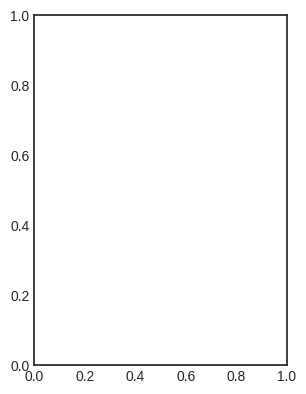

In [ ]:
plt.figure(figsize = (15, 10))
plt.style.use('seaborn-white')

for i, col in enumerate(df.columns, 1):
    plt.subplot(2, 4, i)
    plt.boxplot(df[col])
    plt.title(col)

plt.tight_layout()

In [ ]:
numerical_features=['Weight','Height']
for cols in numerical_features:
    Q1 = data[cols].quantile(0.25)
    Q3 = data[cols].quantile(0.75)
    IQR = Q3 - Q1     

    filter = (data[cols] >= Q1 - 1.5 * IQR) & (data[cols] <= Q3 + 1.5 *IQR)
    data=data.loc[filter]

Text(0.5, 1.0, 'FAF')

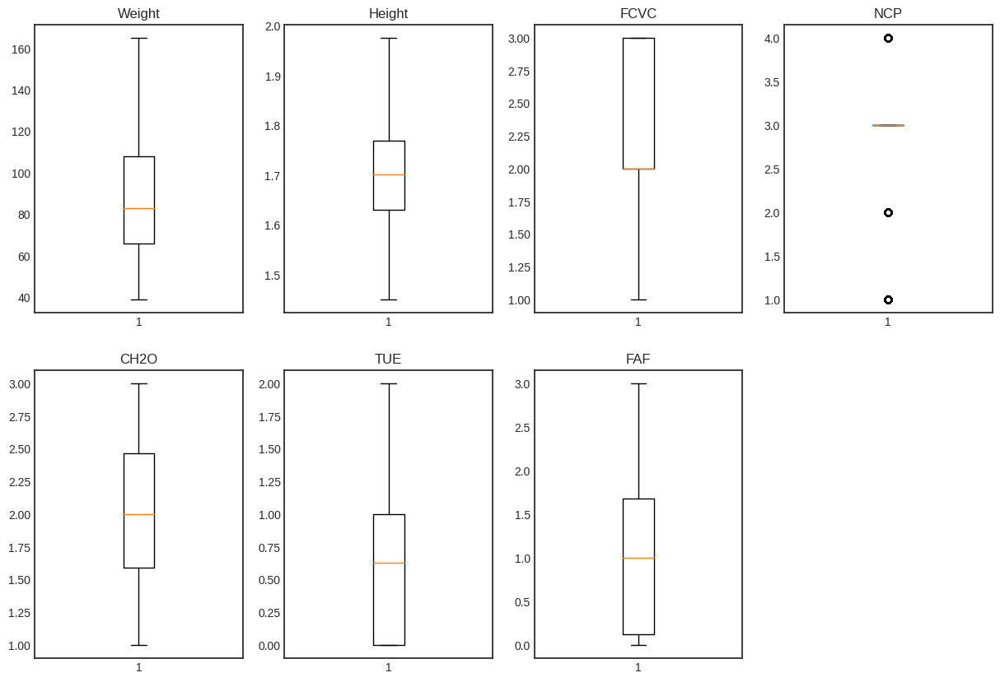

In [ ]:
plt.figure(figsize = (15, 10))
plt.style.use('seaborn-white')
ax=plt.subplot(241)
plt.boxplot(data['Weight'])
ax.set_title('Weight')
ax=plt.subplot(242)
plt.boxplot(data['Height'])
ax.set_title('Height')
ax=plt.subplot(243)
plt.boxplot(data['FCVC'])
ax.set_title('FCVC')
ax=plt.subplot(244)
plt.boxplot(data['NCP'])
ax.set_title('NCP')
ax=plt.subplot(245)
plt.boxplot(data['CH2O'])
ax.set_title('CH2O')
ax=plt.subplot(246)
plt.boxplot(data['TUE'])
ax.set_title('TUE')
ax=plt.subplot(247)
plt.boxplot(data['FAF'])
ax.set_title('FAF')

# 정규화

In [ ]:
# label split
data_label = data['NObeyesdad']
data_label.name = 'Class'  # Class라는 이름으로 저장
data = data.drop('NObeyesdad', axis=1)

In [ ]:
data2 = data.copy()
data3 = data.copy()

In [ ]:
# 스케일링할 컬럼 선택
cols_to_scale = ['Weight', 'Height', 'FCVC',
                 'NCP', 'CH2O', 'TUE', 'FAF']

# StandardScaler 객체 생성 후 fit & transform 수행
sdscaler = StandardScaler()
data[cols_to_scale] = sdscaler.fit_transform(data[cols_to_scale])

# 데이터 프레임으로 저장
sdscaled_data = data

In [ ]:
# 스케일링할 컬럼 선택
cols_to_scale = ['Weight', 'Height', 'FCVC',
                 'NCP', 'CH2O', 'TUE', 'FAF']

# MinMaxScaler 객체 생성 후 fit & transform 수행
mMscaler = MinMaxScaler()
data2[cols_to_scale] = mMscaler.fit_transform(data2[cols_to_scale])

# 데이터 프레임으로 저장
mMscaled_data = data2

In [ ]:
# 스케일링할 컬럼 선택
cols_to_scale = ['Weight', 'Height', 'FCVC',
                 'NCP', 'CH2O', 'TUE', 'FAF']

# RobustScaler 객체 생성 후 fit & transform 수행
robust = RobustScaler()
data3[cols_to_scale] = robust.fit_transform(data3[cols_to_scale])

# 데이터 프레임으로 저장
robust_data = data3

In [ ]:
# label split
data_label = data['NObeyesdad']
data_label.name = 'Class'  # Class라는 이름으로 저장
data = data.drop('NObeyesdad', axis=1)

# PCA

In [ ]:
# 2차원 PCA
pca = PCA(n_components=2)

mMscaled_data = pca.fit_transform(mMscaled_data)
sdscaled_data = pca.fit_transform(sdscaled_data)
robust_data = pca.fit_transform(robust_data)

mMscaled_data = pd.DataFrame(mMscaled_data, columns=['X', 'Y'])
mMscaled_data = pd.concat([mMscaled_data, data_label], axis=1)

sdscaled_data = pd.DataFrame(sdscaled_data, columns=['X', 'Y'])
sdscaled_data = pd.concat([sdscaled_data, data_label], axis=1)

robust_data = pd.DataFrame(robust_data, columns=['X', 'Y'])
robust_data = pd.concat([robust_data, data_label], axis=1)

print(sum(pca.explained_variance_ratio_))
print(pca.components_)

0.914802766864216
[[-4.19196734e-03  9.94550433e-01 -2.87126515e-03  2.03019484e-02
   1.21793881e-02  3.30753181e-03  3.39756965e-04 -6.83549724e-03
  -6.75994929e-03  2.01530069e-03 -4.64890153e-03 -3.89265108e-03
  -1.27827055e-02 -2.89174205e-02  3.89139433e-03  7.76374743e-02
   5.56459879e-02]
 [ 6.25562503e-02  4.19380013e-02 -1.91197809e-01 -4.66282132e-01
  -1.67407582e-01 -7.67764696e-02 -5.09075896e-02 -3.92234881e-03
   1.52461404e-01  6.91411085e-04 -1.65781241e-01  3.08182356e-02
   3.91772257e-02  6.64459022e-03 -7.97494274e-02  1.87559885e-01
  -7.80403466e-01]]


In [ ]:
print(sum(pca.explained_variance_ratio_))

0.683082328091249


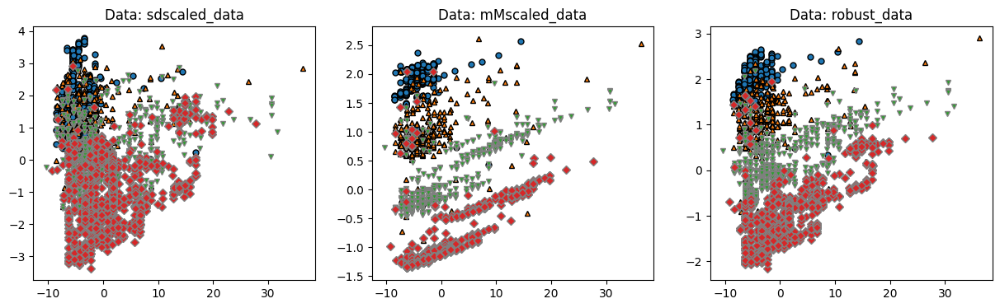

In [ ]:
# 가상의 데이터셋 3가지 그래프
data = {'sdscaled_data':sdscaled_data,  'mMscaled_data': mMscaled_data, 'robust_data': robust_data}
fig, axes = plt.subplots(1,3,figsize=(15,4))
for i in range(3):
    Data = data[list(data.keys())[i]]
    mglearn.discrete_scatter(Data['X'], Data['Y'], Data['Class'], ax=axes[i], s=5)
    axes[i].set_title("Data: " + list(data.keys())[i])

In [ ]:
pca.explained_variance_

array([6.43021435, 1.17339458])

In [ ]:
sum(pca.explained_variance_ratio_)

0.7790602540095621

In [ ]:
sdscaled_data = sdscaled_data.dropna()
mMscaled_data = mMscaled_data.dropna()
robust_data = robust_data.dropna()

# K-means

In [ ]:
# 군집 개수를 2~5까지 늘리면서 실행
for k in range(2, 6):
    print("군집 개수:", k)
    
    # n_init 값이 1일 때 k-means++ 알고리즘으로 모델 생성 및 학습
    kmeans1_s = KMeans(n_clusters=k, init='k-means++', n_init=1)
    kmeans1_m = KMeans(n_clusters=k, init='k-means++', n_init=1)
    kmeans1_r = KMeans(n_clusters=k, init='k-means++', n_init=1)

    kmeans1_s.fit(sdscaled_data)
    kmeans1_m.fit(mMscaled_data)
    kmeans1_r.fit(robust_data)

    labels1_s = kmeans1_s.predict(sdscaled_data)
    labels1_m = kmeans1_m.predict(mMscaled_data)
    labels1_r = kmeans1_r.predict(robust_data)

    score1_s = silhouette_score(sdscaled_data, labels1_s)
    score1_m = silhouette_score(mMscaled_data, labels1_m)
    score1_r = silhouette_score(robust_data, labels1_r)

    sse1_s = kmeans1_s.inertia_
    sse1_m = kmeans1_m.inertia_
    sse1_r = kmeans1_r.inertia_

    print("n_init=1일 때 s_silhouette_score:", score1_s)
    print("n_init=1일 때 s_sse 값:", sse1_s)
    print("n_init=1일 때 m_silhouette_score:", score1_m)
    print("n_init=1일 때 m_sse 값:", sse1_m)
    print("n_init=1일 때 r_silhouette_score:", score1_r)
    print("n_init=1일 때 r_sse 값:", sse1_r)
    print()
    # n_init 값이 10일 때 k-means++ 알고리즘으로 모델 생성 및 학습
    kmeans10_s = KMeans(n_clusters=k, init='k-means++', n_init=10)
    kmeans10_m = KMeans(n_clusters=k, init='k-means++', n_init=10)
    kmeans10_r = KMeans(n_clusters=k, init='k-means++', n_init=10)

    kmeans10_s.fit(sdscaled_data)
    kmeans10_m.fit(mMscaled_data)
    kmeans10_r.fit(robust_data)

    labels10_s = kmeans10_s.predict(sdscaled_data)
    labels10_m = kmeans10_m.predict(mMscaled_data)
    labels10_r = kmeans10_r.predict(robust_data)

    score10_s = silhouette_score(sdscaled_data, labels10_s)
    score10_m = silhouette_score(mMscaled_data, labels10_m)
    score10_r = silhouette_score(robust_data, labels10_r)

    sse10_s = kmeans10_s.inertia_
    sse10_m = kmeans10_m.inertia_
    sse10_r = kmeans10_r.inertia_

    print("n_init=10일 때 s_silhouette_score:", score10_s)
    print("n_init=10일 때 s_sse 값:", sse10_s)
    print("n_init=10일 때 m_silhouette_score:", score10_m)
    print("n_init=10일 때 m_sse 값:", sse10_m)
    print("n_init=10일 때 r_silhouette_score:", score10_r)
    print("n_init=10일 때 r_sse 값:", sse10_r) 
    print()


군집 개수: 2
n_init=1일 때 s_silhouette_score: 0.5565117821215453
n_init=1일 때 s_sse 값: 43756.017122656034
n_init=1일 때 m_silhouette_score: 0.6423806170902014
n_init=1일 때 m_sse 값: 30362.10263715103
n_init=1일 때 r_silhouette_score: 0.6031190948102958
n_init=1일 때 r_sse 값: 35455.410064630065

n_init=10일 때 s_silhouette_score: 0.5565117821215453
n_init=10일 때 s_sse 값: 43756.017122656034
n_init=10일 때 m_silhouette_score: 0.6423806170902014
n_init=10일 때 m_sse 값: 30362.10263715103
n_init=10일 때 r_silhouette_score: 0.6031190948102958
n_init=10일 때 r_sse 값: 35455.410064630065

군집 개수: 3
n_init=1일 때 s_silhouette_score: 0.32036421280561006
n_init=1일 때 s_sse 값: 31894.29520594173
n_init=1일 때 m_silhouette_score: 0.45956492597485865
n_init=1일 때 m_sse 값: 18511.57878704516
n_init=1일 때 r_silhouette_score: 0.38397300283274427
n_init=1일 때 r_sse 값: 23790.939303703846

n_init=10일 때 s_silhouette_score: 0.36249062387266034
n_init=10일 때 s_sse 값: 31068.199681158716
n_init=10일 때 m_silhouette_score: 0.5075619606125201
n_init=10

In [ ]:
# 산점도 가시화
def Simple_Scatter(i, Name):
    Data = data[list(data.keys())[i]]
    G = sns.jointplot(x = 'X', y = 'Y', data = Data, kind='scatter', hue = "Class")
    G.fig.suptitle("Data : " + Name, fontsize = 20, color = 'black', alpha = 0.9)

In [ ]:
# K-Means 클러스터링 함수 실행 후 차트 가시화
def k_Means_Plot(Data, Select_k, NAME, Init_Method='k-means++', Num_Init=10):
    Data2 = Data[['X', 'Y']]
    fig, axes = plt.subplots(1, (np.max(list(Select_k)) - np.min(list(Select_k))) + 1, figsize=(15, 4))
    for i in Select_k:
        Kmeans_Clustering = KMeans(n_clusters=i, init=Init_Method, random_state=2023, n_init=Num_Init)
        Kmeans_Clustering.fit(Data2)
        mglearn.discrete_scatter(Data2['X'], Data2['Y'], Kmeans_Clustering.labels_, ax=axes[i - 2], s=5)
        mglearn.discrete_scatter(Kmeans_Clustering.cluster_centers_[:, 0],
                                 Kmeans_Clustering.cluster_centers_[:, 1],
                                 list(range(i)),
                                 markeredgewidth=3,
                                 ax=axes[i - 2], s=10)
        Score = np.round(silhouette_score(Data2, Kmeans_Clustering.labels_), 3)
        sse = np.round(Kmeans_Clustering.inertia_, 3)  # SSE 계산
        axes[i - 2].set_title(NAME + ' / k = ' + str(i) + ' / S_Score:' + str(Score) + ' / SSE:' + str(sse), fontsize=8)
        axes[i - 2].tick_params(axis='both', which='major', labelsize=8)  # 눈금 레이블 크기 조절
    plt.tight_layout()

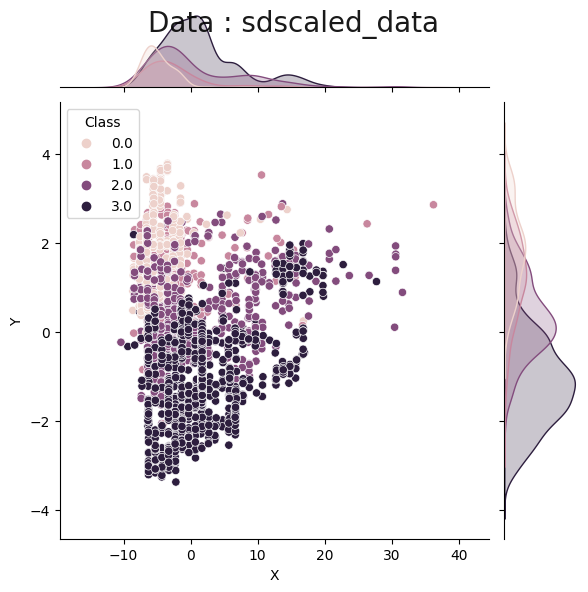

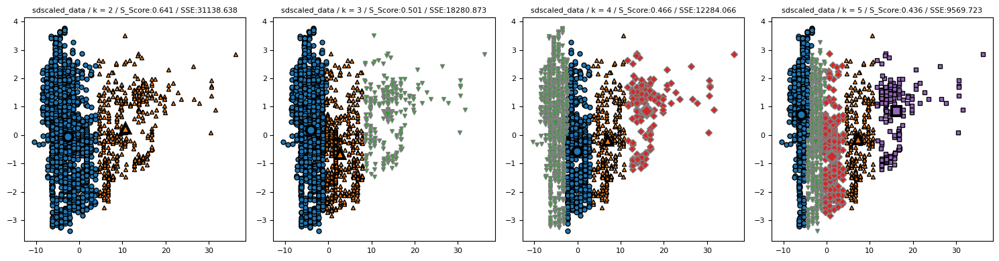

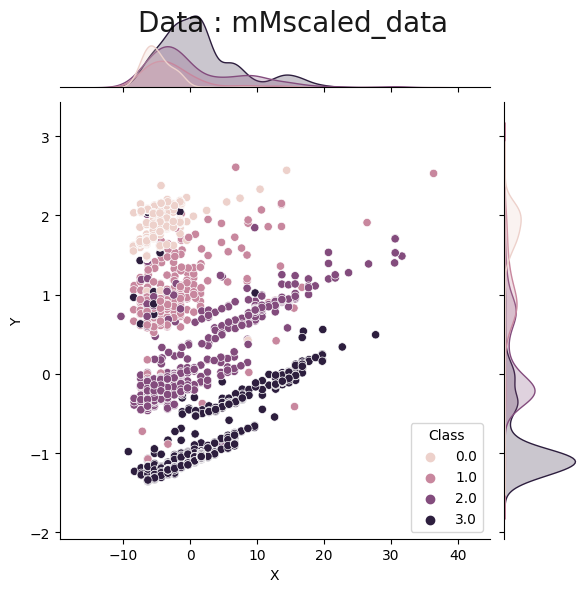

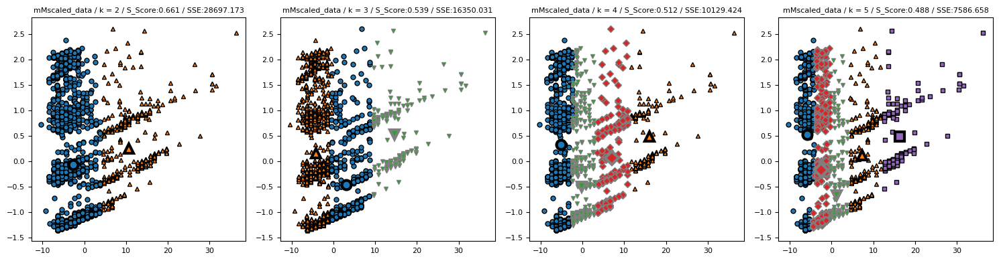

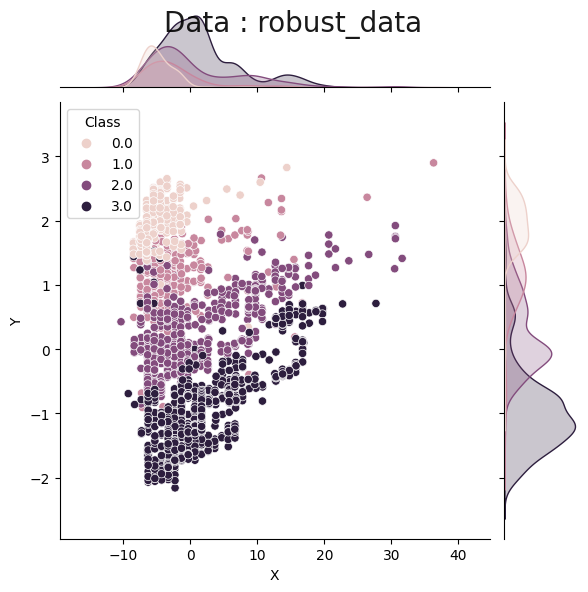

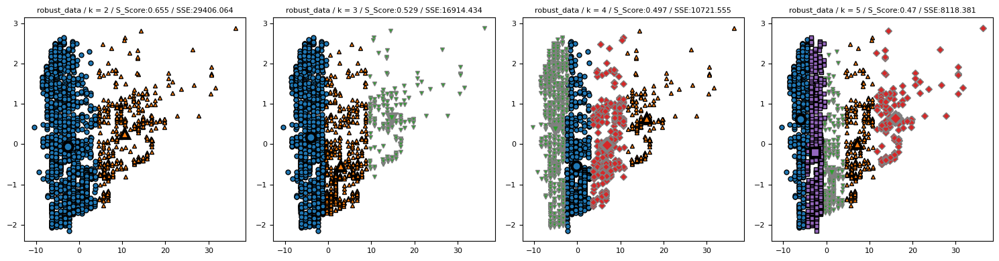

In [ ]:
for i in range(0,3):
    Simple_Scatter(i, list(data.keys())[i])
    
    k_Means_Plot(Data = data[list(data.keys())[i]],
                 Select_k = range(2, 6),
                 NAME = list(data.keys())[i],
                 Init_Method='k-means++',Num_Init=10)

# 계층적 클러스터링

In [ ]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

# 군집 개수를 2~5까지 늘리면서 실행
for k in range(2, 6):
    print("군집 개수:", k)
    
    # linkage 값이 'ward'일 때 hierarchical clustering으로 모델 생성 및 학습
    hier_ward_s = AgglomerativeClustering(n_clusters=k, linkage='ward')
    hier_ward_m = AgglomerativeClustering(n_clusters=k, linkage='ward')
    hier_ward_r = AgglomerativeClustering(n_clusters=k, linkage='ward')

    hier_ward_s.fit(sdscaled_data)
    hier_ward_m.fit(mMscaled_data)
    hier_ward_r.fit(robust_data)

    labels_ward_s = hier_ward_s.labels_
    labels_ward_m = hier_ward_m.labels_
    labels_ward_r = hier_ward_r.labels_

    score_ward_s = silhouette_score(sdscaled_data, labels_ward_s)
    score_ward_m = silhouette_score(mMscaled_data, labels_ward_m)
    score_ward_r = silhouette_score(robust_data, labels_ward_r)

    print("linkage='ward'일 때 s_silhouette_score:", score_ward_s)
    print("linkage='ward'일 때 m_silhouette_score:", score_ward_m)
    print("linkage='ward'일 때 r_silhouette_score:", score_ward_r)
    print()
    
    # linkage 값이 'complete'일 때 hierarchical clustering으로 모델 생성 및 학습
    hier_complete_s = AgglomerativeClustering(n_clusters=k, linkage='complete')
    hier_complete_m = AgglomerativeClustering(n_clusters=k, linkage='complete')
    hier_complete_r = AgglomerativeClustering(n_clusters=k, linkage='complete')

    hier_complete_s.fit(sdscaled_data)
    hier_complete_m.fit(mMscaled_data)
    hier_complete_r.fit(robust_data)

    labels_complete_s = hier_complete_s.labels_
    labels_complete_m = hier_complete_m.labels_
    labels_complete_r = hier_complete_r.labels_

    score_complete_s = silhouette_score(sdscaled_data, labels_complete_s)
    score_complete_m = silhouette_score(mMscaled_data, labels_complete_m)
    score_complete_r = silhouette_score(robust_data, labels_complete_r)

    print("linkage='complete'일 때 s_silhouette_score:", score_complete_s)
    print("linkage='complete'일 때 m_silhouette_score:", score_complete_m)
    print("linkage='complete'일 때 r_silhouette_score:", score_complete_r)
    print()
    
    # linkage 값이 'average'일 때 hierarchical clustering으로 모델 생성 및 학습
    hier_average_s = AgglomerativeClustering(n_clusters=k, linkage='average')
    hier_average_m = AgglomerativeClustering(n_clusters=k, linkage='average')
    hier_average_r = AgglomerativeClustering(n_clusters=k, linkage='average')

    hier_average_s.fit(sdscaled_data)
    hier_average_m.fit(mMscaled_data)
    hier_average_r.fit(robust_data)

    labels_average_s = hier_average_s.labels_
    labels_average_m = hier_average_m.labels_
    labels_average_r = hier_average_r.labels_

    score_average_s = silhouette_score(sdscaled_data, labels_average_s)
    score_average_m = silhouette_score(mMscaled_data, labels_average_m)
    score_average_r = silhouette_score(robust_data, labels_average_r)

    print("linkage='average'일 때 s_silhouette_score:", score_average_s)
    print("linkage='average'일 때 m_silhouette_score:", score_average_m)
    print("linkage='average'일 때 r_silhouette_score:", score_average_r)
    print()


군집 개수: 2
linkage='ward'일 때 s_silhouette_score: 0.5530890288686092
linkage='ward'일 때 m_silhouette_score: 0.6411897371535406
linkage='ward'일 때 r_silhouette_score: 0.6026518790332709

linkage='complete'일 때 s_silhouette_score: 0.5835890589165664
linkage='complete'일 때 m_silhouette_score: 0.6436636709772908
linkage='complete'일 때 r_silhouette_score: 0.6014918282827431

linkage='average'일 때 s_silhouette_score: 0.6998488752105084
linkage='average'일 때 m_silhouette_score: 0.7346067007590663
linkage='average'일 때 r_silhouette_score: 0.7195268070399667

군집 개수: 3
linkage='ward'일 때 s_silhouette_score: 0.2866223293859975
linkage='ward'일 때 m_silhouette_score: 0.43126242359723554
linkage='ward'일 때 r_silhouette_score: 0.33733803978295374

linkage='complete'일 때 s_silhouette_score: 0.5644475462649062
linkage='complete'일 때 m_silhouette_score: 0.6253214571695265
linkage='complete'일 때 r_silhouette_score: 0.5898559425744293

linkage='average'일 때 s_silhouette_score: 0.5379680939420165
linkage='average'일 때 m_silh

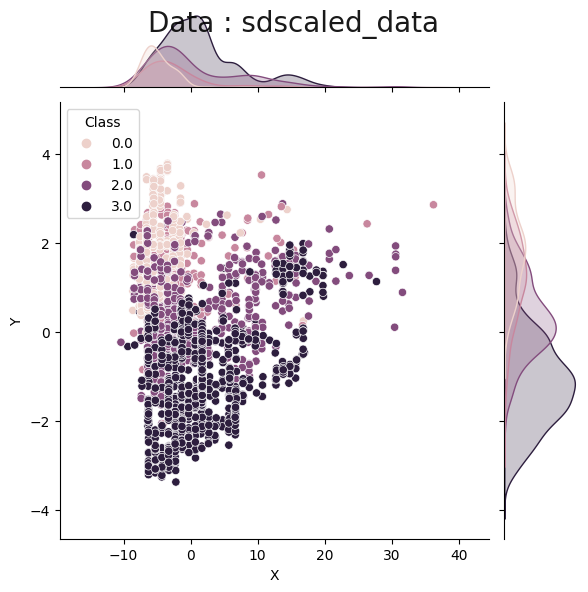

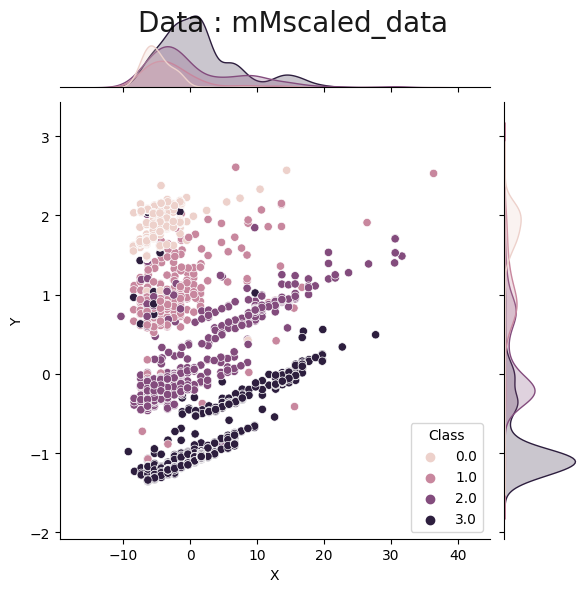

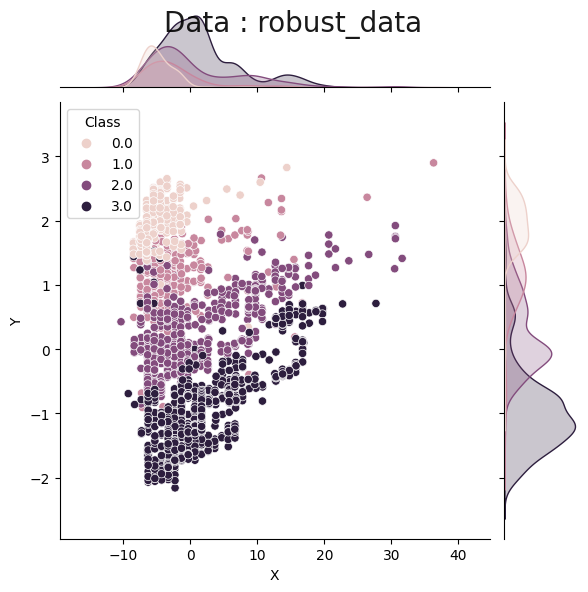

In [ ]:
# # Well seperated dataset
for i in range(3):
    Simple_Scatter(i, list(data.keys())[i])

def Fixed_Dendrogram(Data, Num_of_p, Full_Use):
    Linkage_Matrix = linkage(Data,'average')
    if(Full_Use == True):
        Num_of_p = np.shape(Data)[0]
        plt.figure(figsize=(10,8))
        plt.title('Hierarchical Clustering Dendrogram')
        plt.xlabel('sample index')
    else:
        plt.figure(figsize=(10,8))
        plt.title('Hierarchical Clustering Dendrogram (truncated)')
        plt.xlabel('sample index or (cluster size)')
    plt.ylabel('distance')
    dendrogram(
        Linkage_Matrix,
        p = Num_of_p, 
        leaf_rotation = 90.,
        leaf_font_size = 12.,
        color_threshold = 'default'
    )
    plt.show()


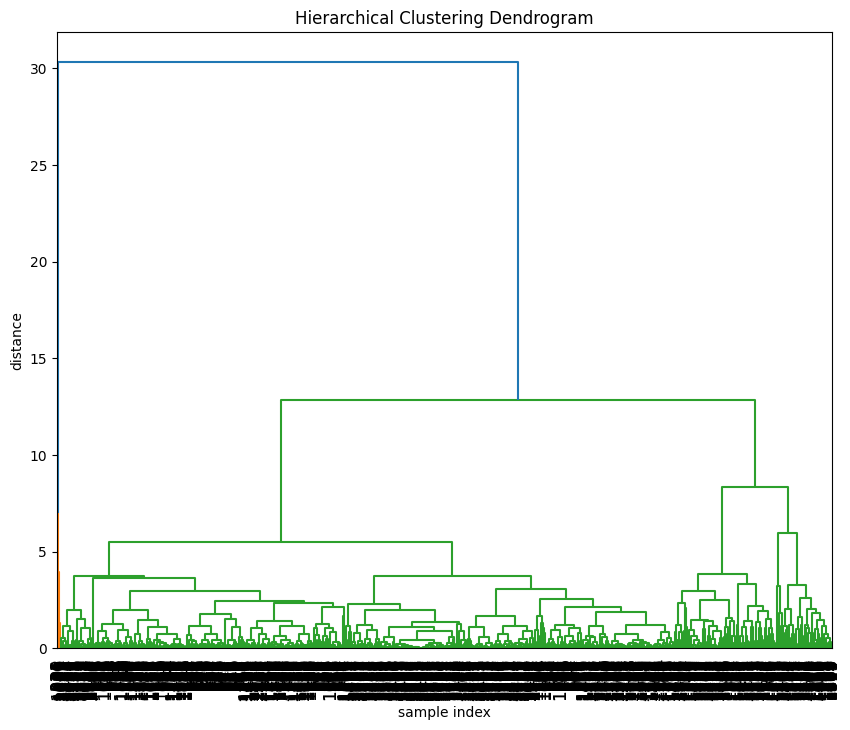

In [ ]:
Fixed_Dendrogram(sdscaled_data[['X','Y']], 20, True)

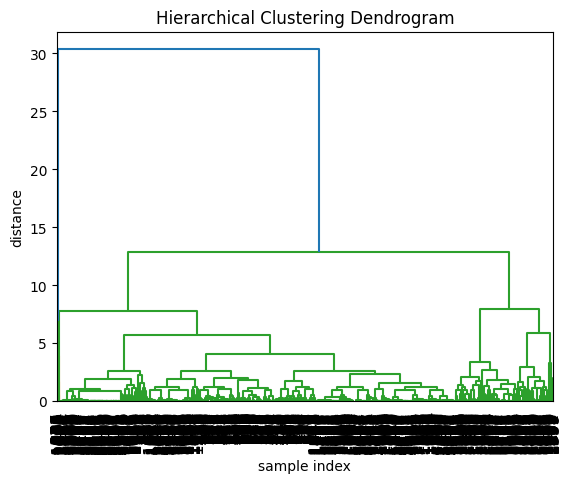

In [ ]:
Fixed_Dendrogram(mMscaled_data[['X','Y']], -1, True)

In [ ]:
Fixed_Dendrogram(robust_data[['X','Y']],-1, True)

KeyboardInterrupt: ignored

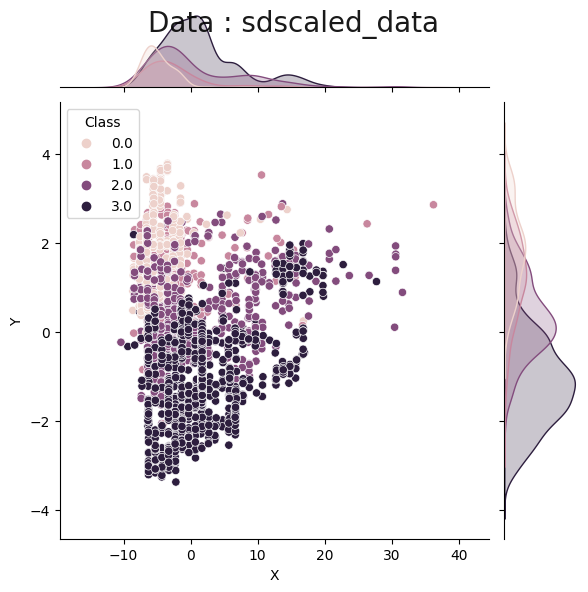

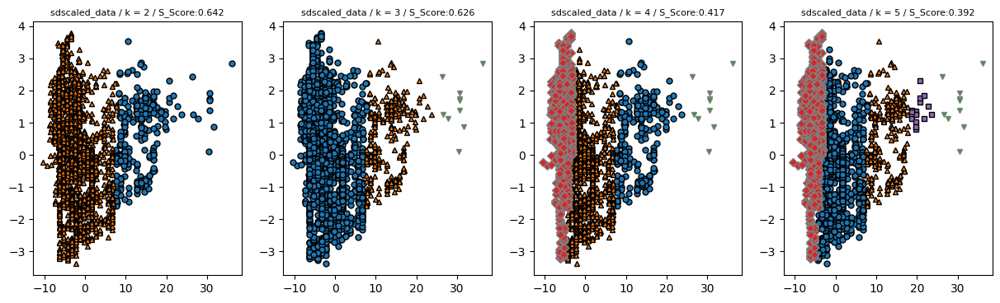

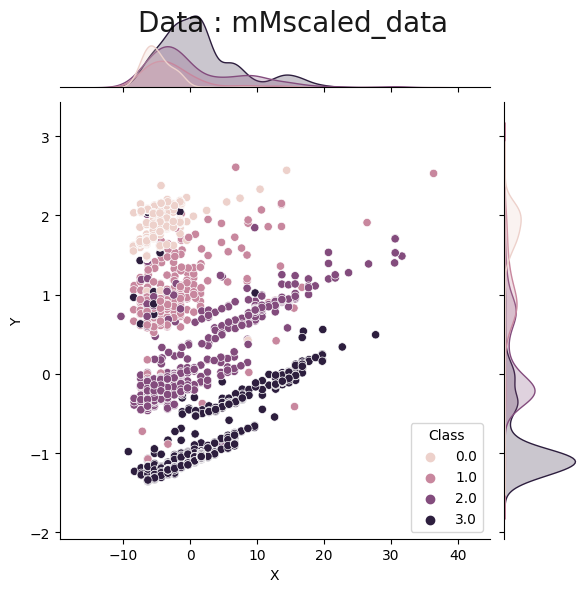

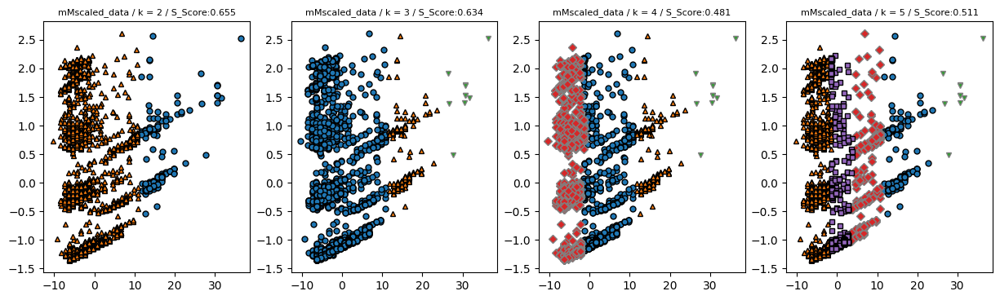

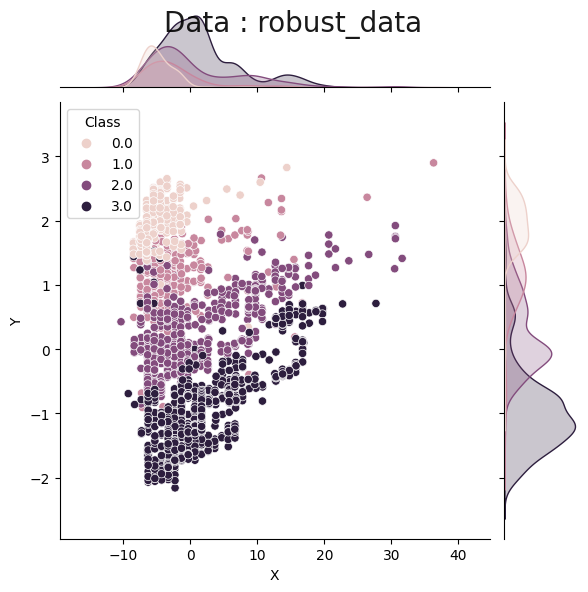

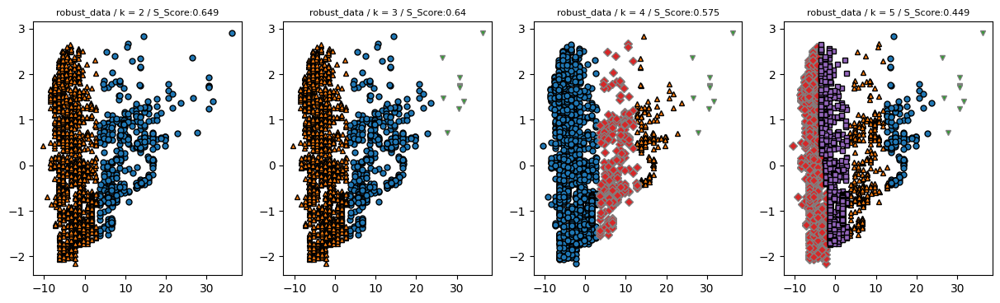

In [ ]:
def Hclust_Plot(Data,Select_k,NAME):
    Data2 = Data[['X', 'Y']]    
    fig, axes = plt.subplots(1, (np.max(list(Select_k))-np.min(list(Select_k)))+1, figsize=(15, 4))
    for i in Select_k:
        H_Clustering = AgglomerativeClustering(n_clusters=i,linkage="complete")
        P_Labels = H_Clustering.fit_predict(Data2)
        mglearn.discrete_scatter(Data2['X'], Data2['Y'], P_Labels, ax=axes[i - 2], s=5)        
        axes[i - 2].set_title("Data:" + NAME + ' / k = ' + str(i))
        Score=np.round(silhouette_score(Data2,P_Labels),3)
        axes[i - 2].set_title( NAME + ' / k = ' + str(i)+' / S_Score:'+str(Score), fontsize=8)
for i in range(0,3):
    Simple_Scatter(i, list(data.keys())[i])
    Hclust_Plot(data[list(data.keys())[i]],
                range(2, 6), list(data.keys())[i])

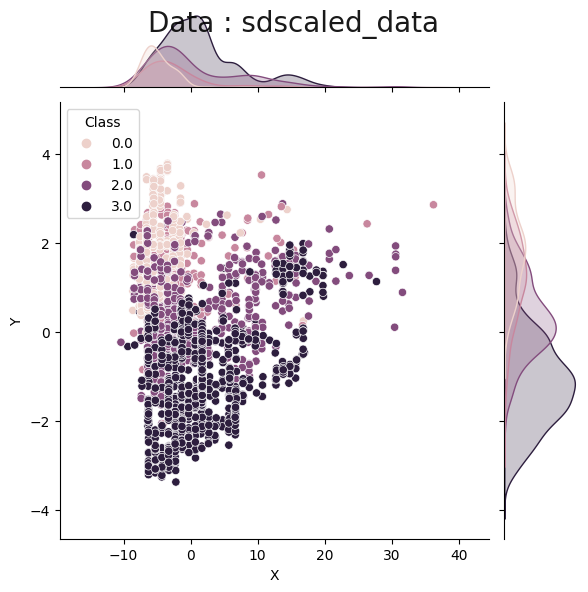

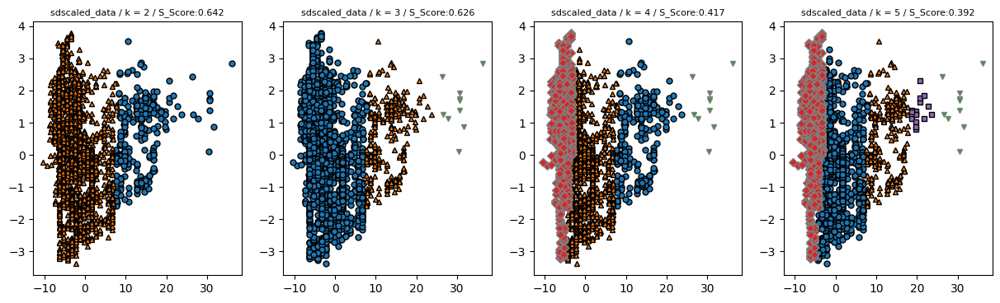

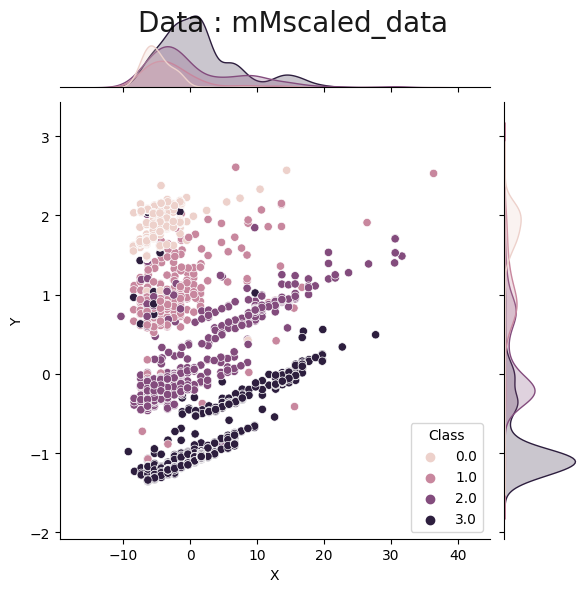

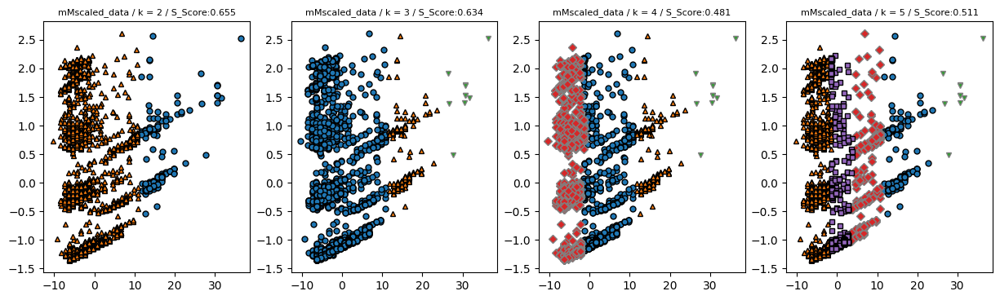

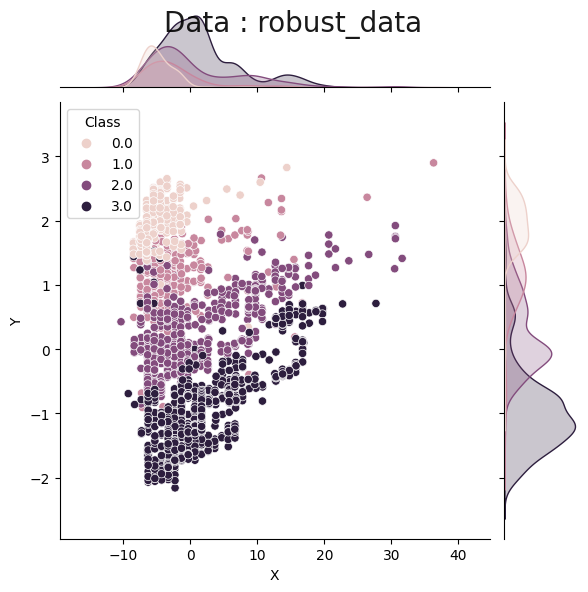

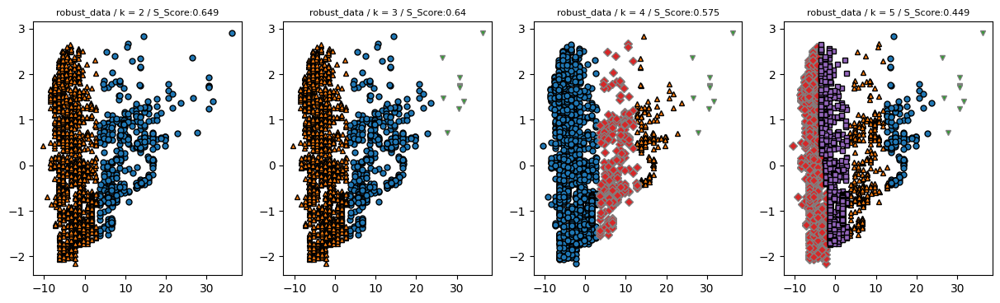

In [ ]:
for i in range(0,3):
    Simple_Scatter(i, list(data.keys())[i])
    Hclust_Plot(data[list(data.keys())[i]],
                range(2, 6), list(data.keys())[i])

In [ ]:
pca.explained_variance_ratio_

array([0.60354064, 0.39508853])

# Affinity Propagation

In [ ]:
from sklearn.cluster import AffinityPropagation
from sklearn.metrics import silhouette_score

# damping 값을 0.5와 0.7로 각각 설정하고 실행
for damping in [0.5, 0.7]:
    print("damping 값:", damping)

    # affinity='euclidean', damping 값이 damping일 때 Affinity Propagation으로 모델 생성 및 학습
    ap_euc_s = AffinityPropagation(affinity='euclidean', damping=damping)
    ap_euc_m = AffinityPropagation(affinity='euclidean', damping=damping)
    ap_euc_r = AffinityPropagation(affinity='euclidean', damping=damping)

    ap_euc_s.fit(sdscaled_data)
    ap_euc_m.fit(mMscaled_data)
    ap_euc_r.fit(robust_data)

    labels_euc_s = ap_euc_s.labels_
    labels_euc_m = ap_euc_m.labels_
    labels_euc_r = ap_euc_r.labels_

    score_euc_s = silhouette_score(sdscaled_data, labels_euc_s)
    score_euc_m = silhouette_score(mMscaled_data, labels_euc_m)
    score_euc_r = silhouette_score(robust_data, labels_euc_r)

    print("affinity='euclidean', damping =", damping, "일 때 s_silhouette_score:", score_euc_s)
    print("affinity='euclidean', damping =", damping, "일 때 m_silhouette_score:", score_euc_m)
    print("affinity='euclidean', damping =", damping, "일 때 r_silhouette_score:", score_euc_r)
    print()


damping 값: 0.5
affinity='euclidean', damping = 0.5 일 때 s_silhouette_score: 0.22626597570778254
affinity='euclidean', damping = 0.5 일 때 m_silhouette_score: 0.23893482167219435
affinity='euclidean', damping = 0.5 일 때 r_silhouette_score: 0.21987226271007898

damping 값: 0.7
affinity='euclidean', damping = 0.7 일 때 s_silhouette_score: 0.2255419609067657
affinity='euclidean', damping = 0.7 일 때 m_silhouette_score: 0.23793470778257522
affinity='euclidean', damping = 0.7 일 때 r_silhouette_score: 0.2259726163036472



# DBSCAN

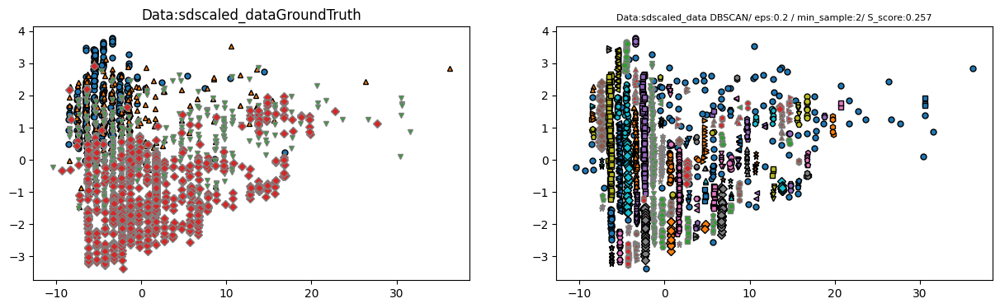

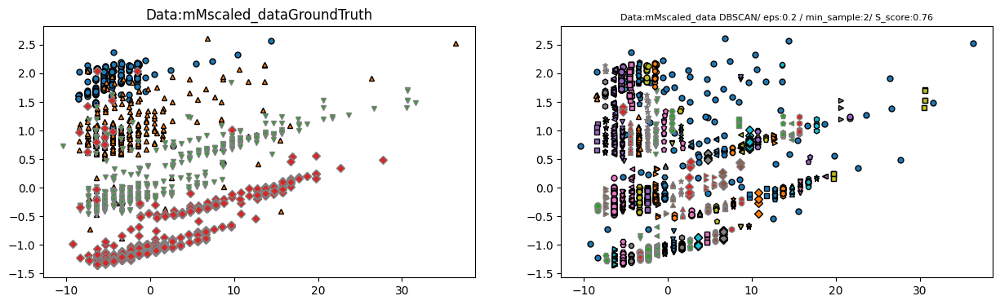

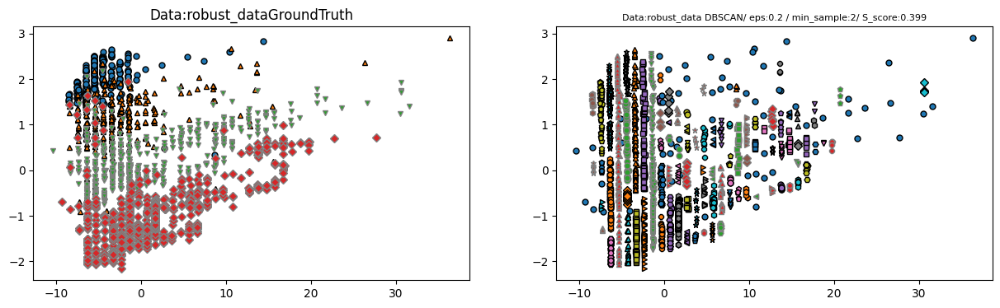

In [ ]:
def DBSCAN_Plot(Data,NAME,min_samples=2,eps=0.2):
    
    Data2 = Data[['X', 'Y']]
    Append_k_Means_Results = list()
    fig, axes = plt.subplots(1, 2, figsize=(15, 4))
    Set_DBSCAN_Hyperparameter=DBSCAN(min_samples=min_samples,eps=eps)
    Results = Set_DBSCAN_Hyperparameter.fit_predict(Data2)
    Score=np.round(silhouette_score(Data2,Results),3)
    mglearn.discrete_scatter(Data2['X'], Data2['Y'], Data['Class'], ax=axes[0], s=5)
    axes[0].set_title("Data:" + NAME + 'GroundTruth')    
    mglearn.discrete_scatter(Data2['X'], Data2['Y'], Results, ax=axes[1], s=5)
    axes[1].set_title("Data:" + NAME + ' DBSCAN/ eps:'+str(eps)+' / min_sample:'+str(min_samples)+'/ S_score:'+str(Score), fontsize=8)


DBSCAN_Plot(Data=sdscaled_data,NAME="sdscaled_data")
DBSCAN_Plot(Data=mMscaled_data,NAME="mMscaled_data")
DBSCAN_Plot(Data=robust_data,NAME="robust_data")

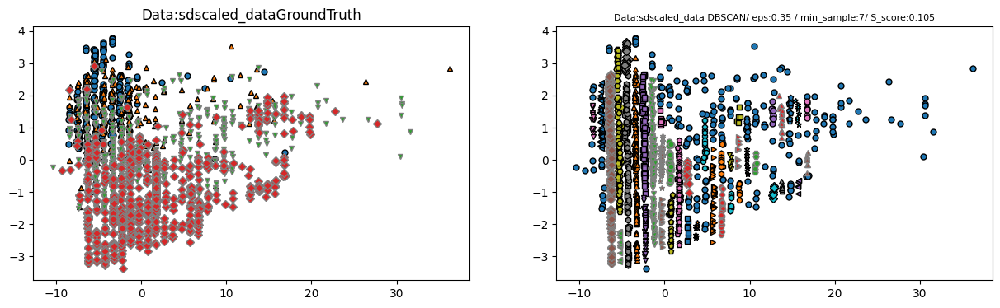

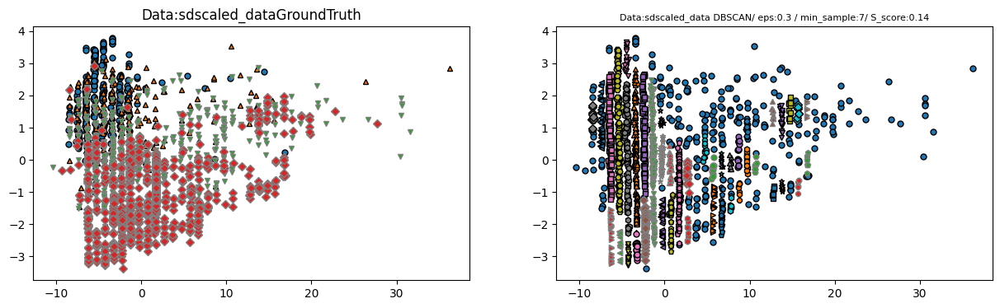

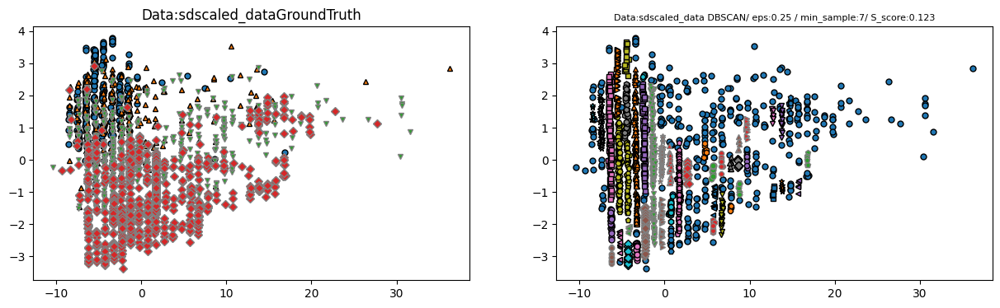

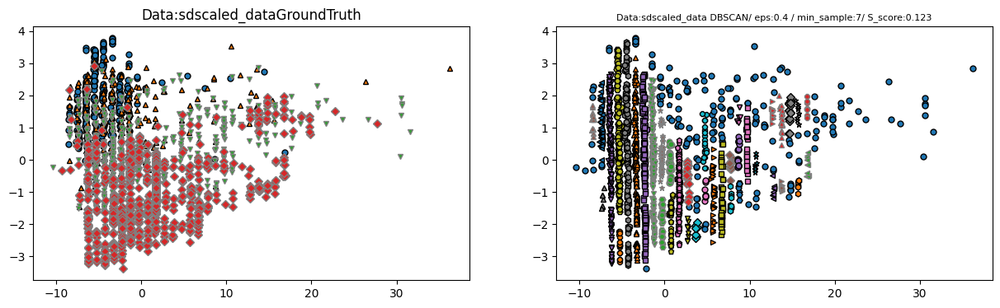

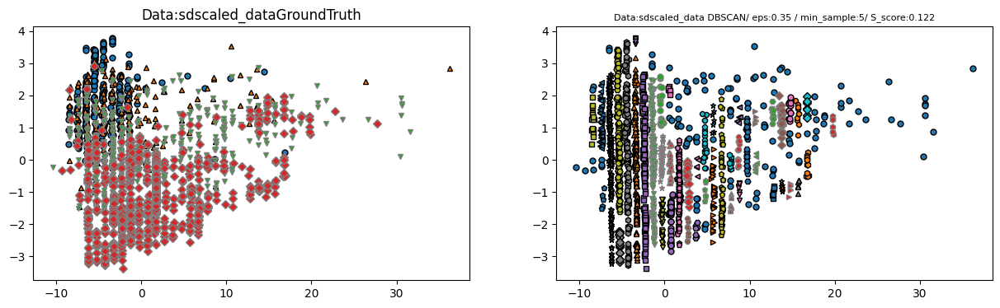

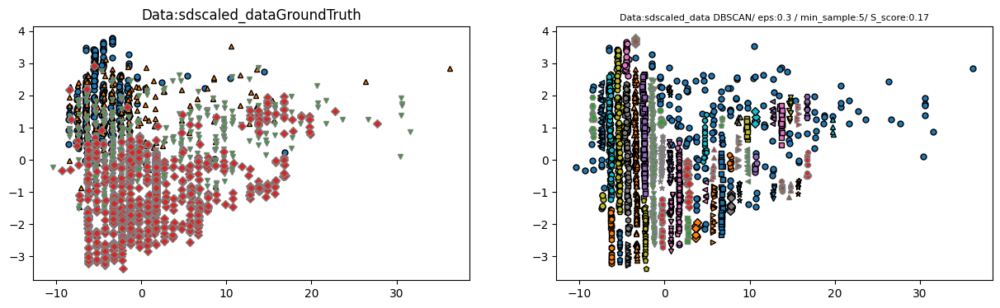

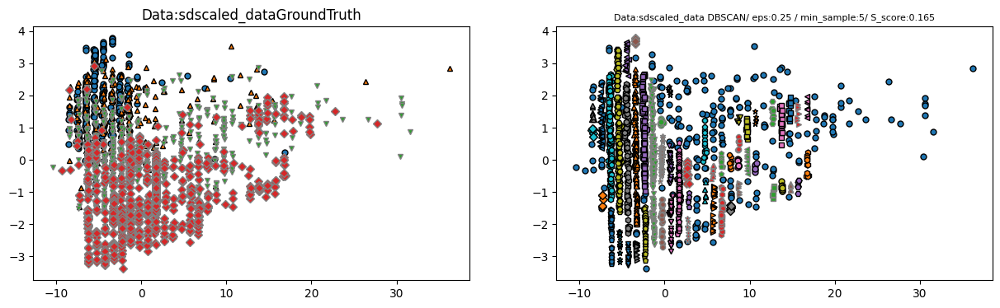

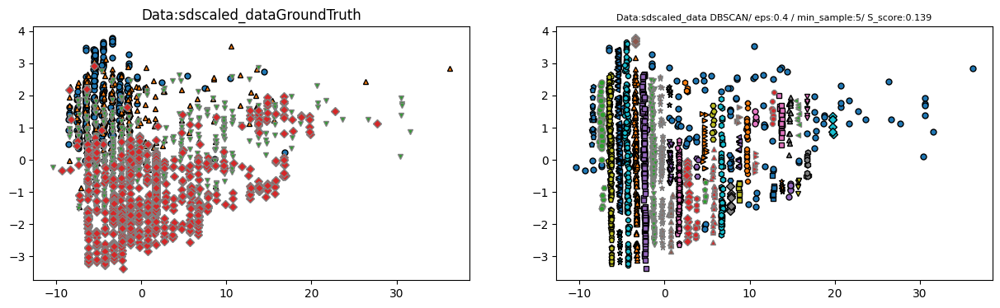

In [ ]:
DBSCAN_Plot(Data=sdscaled_data,NAME="sdscaled_data",min_samples=7,eps=0.35)
DBSCAN_Plot(Data=sdscaled_data,NAME="sdscaled_data",min_samples=7,eps=0.30)
DBSCAN_Plot(Data=sdscaled_data,NAME="sdscaled_data",min_samples=7,eps=0.25)
DBSCAN_Plot(Data=sdscaled_data,NAME="sdscaled_data",min_samples=7,eps=0.40)
DBSCAN_Plot(Data=sdscaled_data,NAME="sdscaled_data",min_samples=5,eps=0.35)
DBSCAN_Plot(Data=sdscaled_data,NAME="sdscaled_data",min_samples=5,eps=0.30)
DBSCAN_Plot(Data=sdscaled_data,NAME="sdscaled_data",min_samples=5,eps=0.25)
DBSCAN_Plot(Data=sdscaled_data,NAME="sdscaled_data",min_samples=5,eps=0.40)

ValueError: ignored

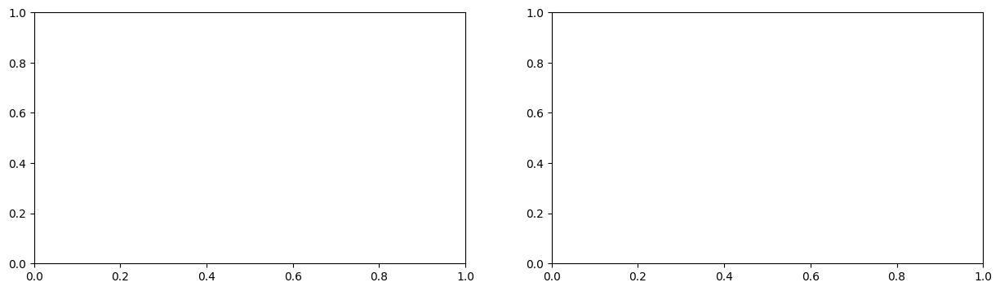

In [ ]:
DBSCAN_Plot(Data=mMscaled_data,NAME="mMscaled_data",min_samples=13,eps=1.3)
DBSCAN_Plot(Data=mMscaled_data,NAME="mMscaled_data",min_samples=13,eps=1.4)
DBSCAN_Plot(Data=mMscaled_data,NAME="mMscaled_data",min_samples=13,eps=1.5)
DBSCAN_Plot(Data=mMscaled_data,NAME="mMscaled_data",min_samples=13,eps=1.2)
# DBSCAN_Plot(Data=mMscaled_data,NAME="mMscaled_data",min_samples=5,eps=0.35)
# DBSCAN_Plot(Data=mMscaled_data,NAME="mMscaled_data",min_samples=5,eps=0.30)
# DBSCAN_Plot(Data=mMscaled_data,NAME="mMscaled_data",min_samples=5,eps=0.25)
# DBSCAN_Plot(Data=mMscaled_data,NAME="mMscaled_data",min_samples=5,eps=0.40)

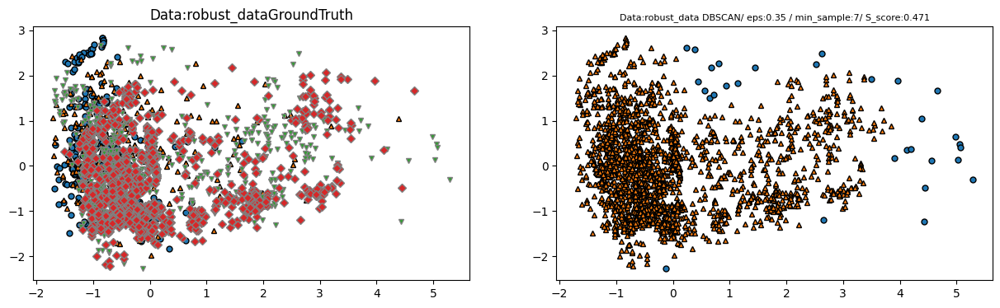

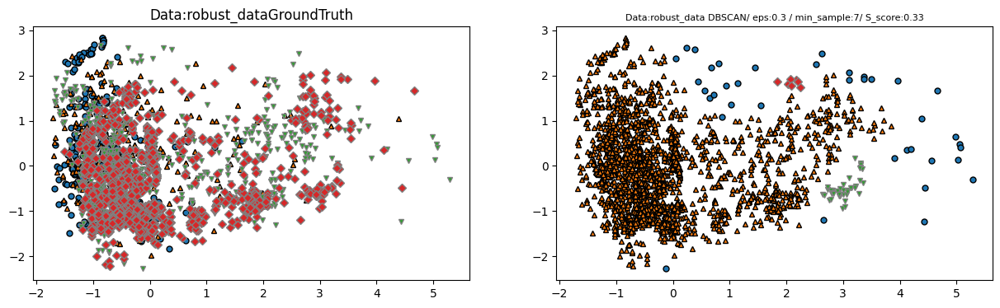

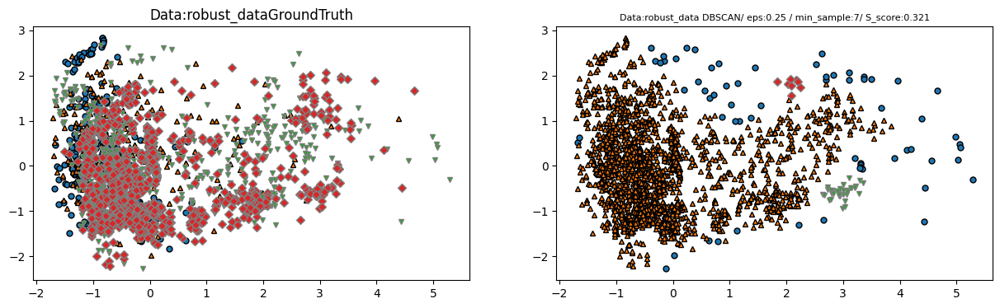

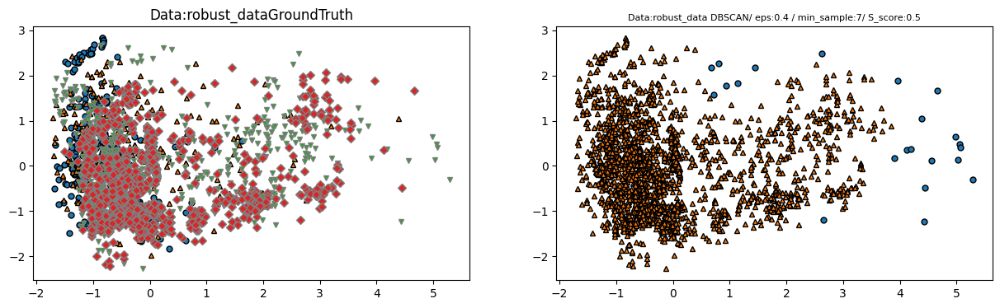

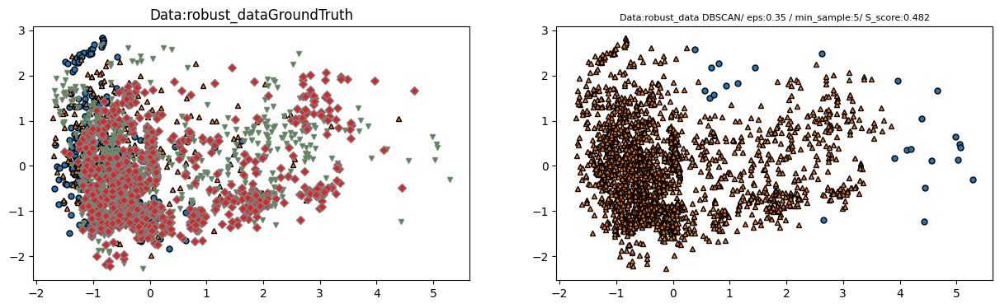

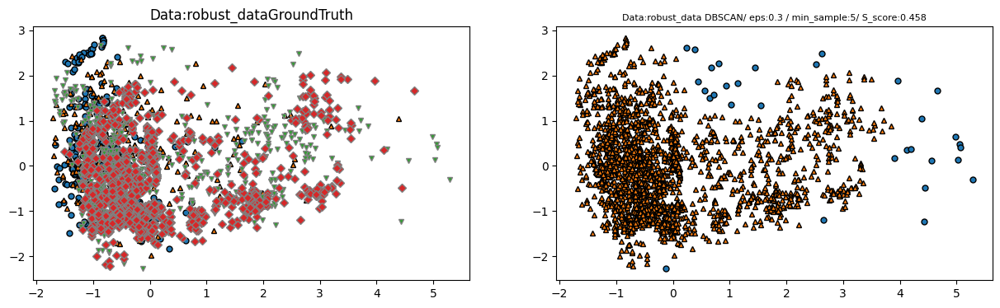

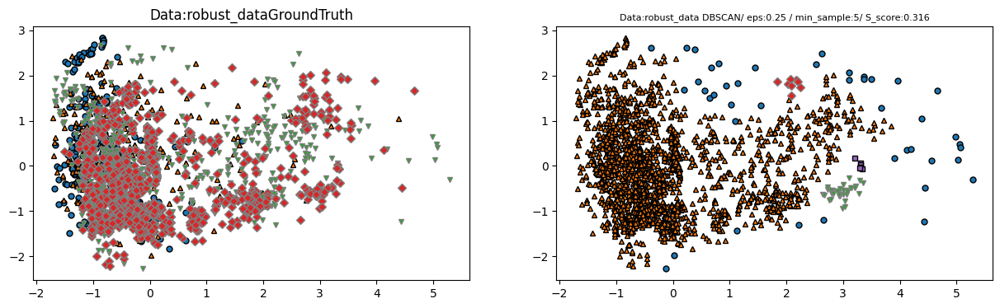

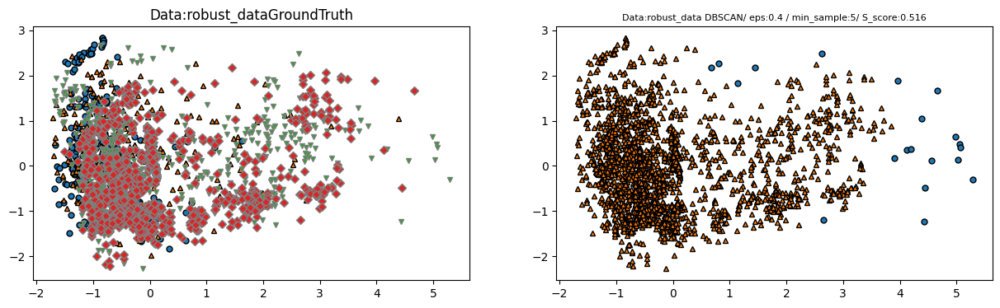

In [ ]:
DBSCAN_Plot(Data=robust_data,NAME="robust_data",min_samples=7,eps=0.35)
DBSCAN_Plot(Data=robust_data,NAME="robust_data",min_samples=7,eps=0.30)
DBSCAN_Plot(Data=robust_data,NAME="robust_data",min_samples=7,eps=0.25)
DBSCAN_Plot(Data=robust_data,NAME="robust_data",min_samples=7,eps=0.40)
DBSCAN_Plot(Data=robust_data,NAME="robust_data",min_samples=5,eps=0.35)
DBSCAN_Plot(Data=robust_data,NAME="robust_data",min_samples=5,eps=0.30)
DBSCAN_Plot(Data=robust_data,NAME="robust_data",min_samples=5,eps=0.25)
DBSCAN_Plot(Data=robust_data,NAME="robust_data",min_samples=5,eps=0.40)

In [ ]:
def find_best_hyperparams(data):
    best_score = -1
    best_min_samples = None
    best_eps = None
    
    for min_samples in range(2, 20):
        for eps in np.arange(0.1, 3, 0.1):
            dbscan = DBSCAN(min_samples=min_samples, eps=eps)
            results = dbscan.fit_predict(data)
            unique_labels = np.unique(results)
            
            if len(unique_labels) == 1:
                continue
            score = silhouette_score(data, results)
            
            if score > best_score:
                best_score = score
                best_min_samples = min_samples
                best_eps = eps
    
    print(f"Best min_samples: {best_min_samples}")
    print(f"Best eps: {best_eps}")
    print(f"Best silhouette score: {best_score}")
    print()

find_best_hyperparams(sdscaled_data)
find_best_hyperparams(mMscaled_data)
find_best_hyperparams(robust_data)


Best min_samples: 7
Best eps: 2.1
Best silhouette score: 0.7252114341571937

Best min_samples: 2
Best eps: 0.4
Best silhouette score: 0.7795341803759313

Best min_samples: 7
Best eps: 2.0
Best silhouette score: 0.7307787516645396



In [ ]:
find_best_hyperparams(sdscaled_data)
find_best_hyperparams(mMscaled_data)
find_best_hyperparams(robust_data)

ValueError: ignored

# DBSCAN 튜닝

In [ ]:
# sdscaled_data에서 X와 Class 추출
X = sdscaled_data[['X', 'Y']].values
labels_true = sdscaled_data['Class'].values

In [ ]:
def find_best_hyperparams(data):
    best_v_measure_score = -1
    best_min_samples = None
    best_eps = None
    
    X = data[['X', 'Y']].values
    labels_true = data['Class'].values

    for min_samples in range(2, 20):
        for eps in np.arange(0.01, 2, 0.01):
            dbscan = DBSCAN(min_samples=min_samples, eps=eps)
            results = dbscan.fit_predict(X)
            unique_labels = np.unique(results)
            
            if len(unique_labels) == 1:
                continue
                
            v_measure_score_val = v_measure_score(labels_true, results)
            
            if v_measure_score_val > best_v_measure_score:
                best_v_measure_score = v_measure_score_val
                best_min_samples = min_samples
                best_eps = eps
    
    print(f"Best min_samples: {best_min_samples}")
    print(f"Best eps: {best_eps}")
    print(f"Best V-measure score: {best_v_measure_score}")
    print()


In [ ]:
find_best_hyperparams(sdscaled_data)
find_best_hyperparams(mMscaled_data)
find_best_hyperparams(robust_data)

Best min_samples: 2
Best eps: 0.08
Best V-measure score: 0.2385615601862673

Best min_samples: 2
Best eps: 0.11
Best V-measure score: 0.3861829612152628

Best min_samples: 2
Best eps: 0.08
Best V-measure score: 0.33088180939784795



Hyperparameters: [ e: 0.01 , n: 2 ]
V-measure: 0.199
Silhouette score: -0.428


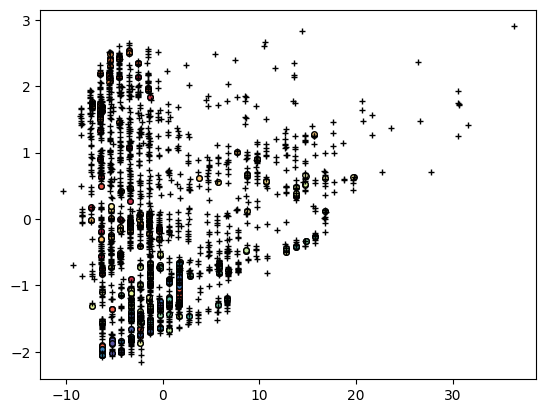

Hyperparameters: [ e: 0.02 , n: 2 ]
V-measure: 0.255
Silhouette score: -0.136


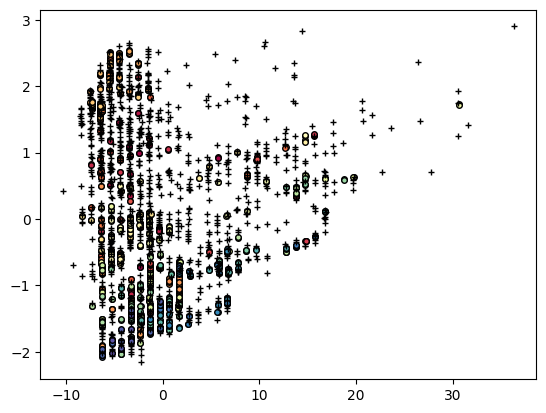

Hyperparameters: [ e: 0.03 , n: 2 ]
V-measure: 0.287
Silhouette score: 0.011


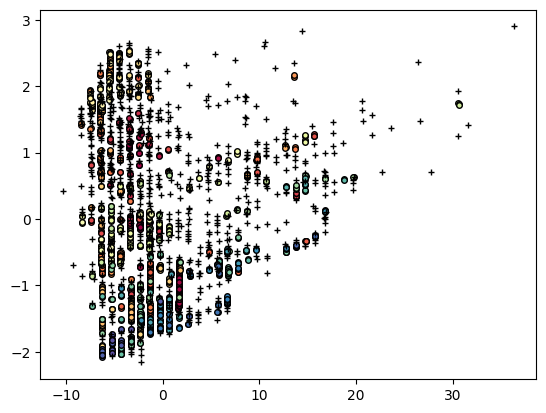

Hyperparameters: [ e: 0.04 , n: 2 ]
V-measure: 0.305
Silhouette score: 0.192


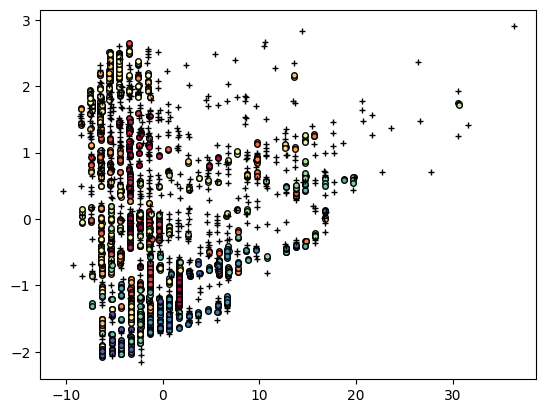

Hyperparameters: [ e: 0.05 , n: 2 ]
V-measure: 0.317
Silhouette score: 0.262


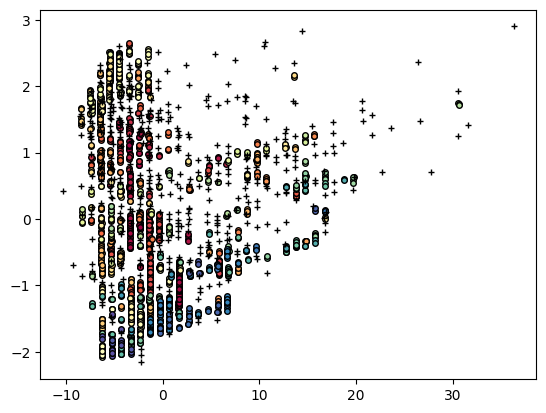

Hyperparameters: [ e: 0.06 , n: 2 ]
V-measure: 0.324
Silhouette score: 0.321


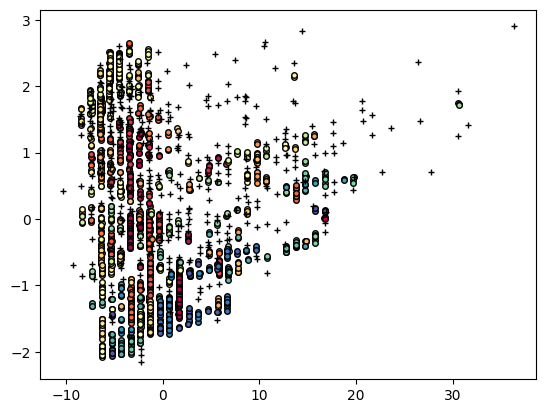

Hyperparameters: [ e: 0.07 , n: 2 ]
V-measure: 0.323
Silhouette score: 0.343


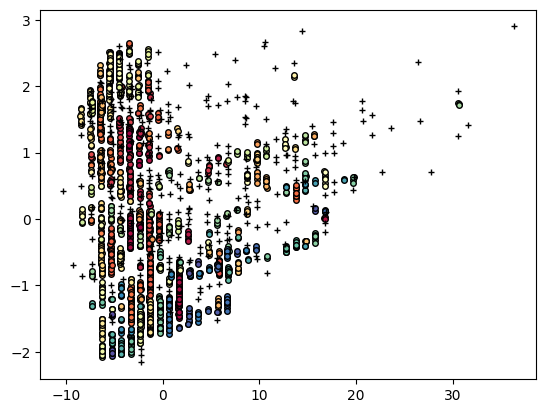

Hyperparameters: [ e: 0.08 , n: 2 ]
V-measure: 0.331
Silhouette score: 0.383


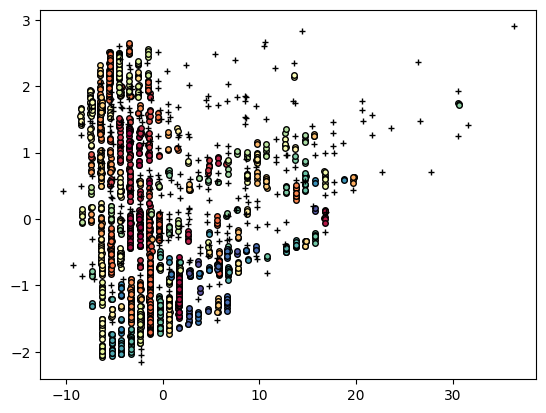

Hyperparameters: [ e: 0.09 , n: 2 ]
V-measure: 0.322
Silhouette score: 0.392


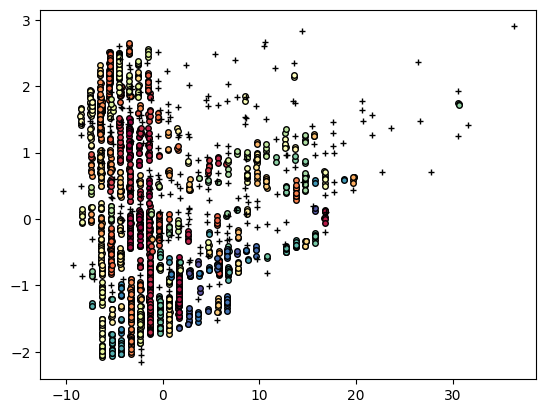

Hyperparameters: [ e: 0.1 , n: 2 ]
V-measure: 0.325
Silhouette score: 0.407


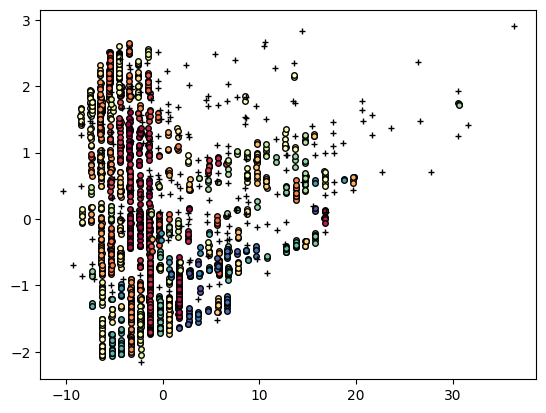

Hyperparameters: [ e: 0.11 , n: 2 ]
V-measure: 0.328
Silhouette score: 0.417


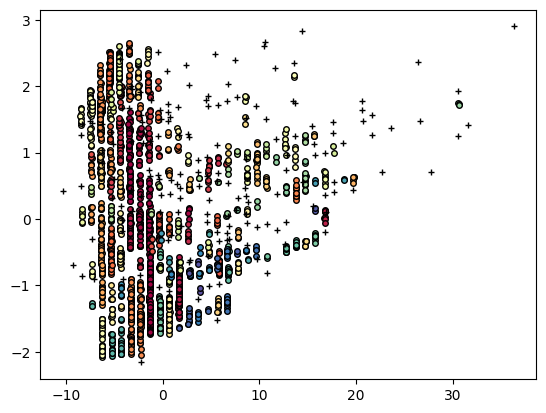

Hyperparameters: [ e: 0.12 , n: 2 ]
V-measure: 0.330
Silhouette score: 0.438


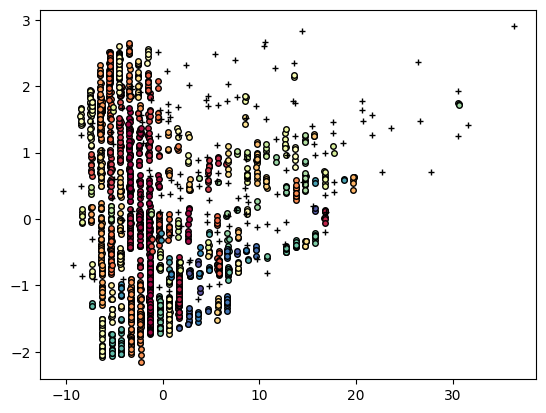

Hyperparameters: [ e: 0.13 , n: 2 ]
V-measure: 0.326
Silhouette score: 0.440


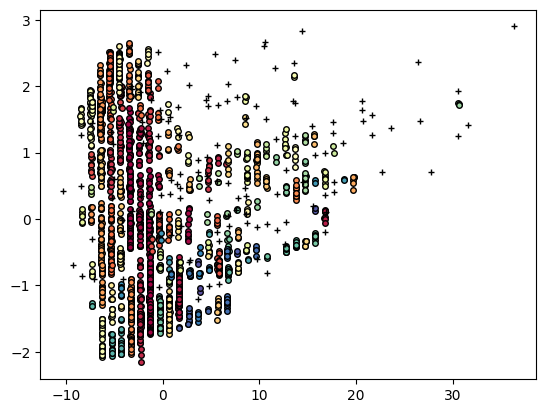

Hyperparameters: [ e: 0.14 , n: 2 ]
V-measure: 0.304
Silhouette score: 0.406


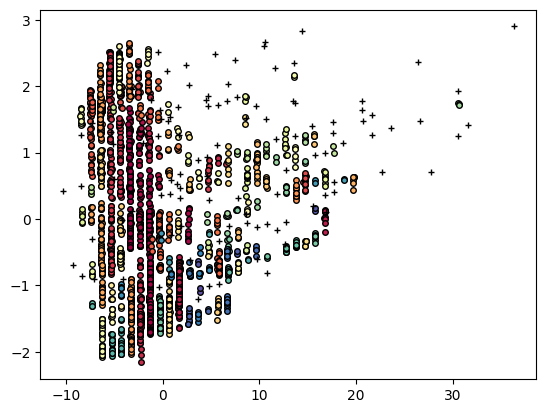

Hyperparameters: [ e: 0.15 , n: 2 ]
V-measure: 0.293
Silhouette score: 0.382


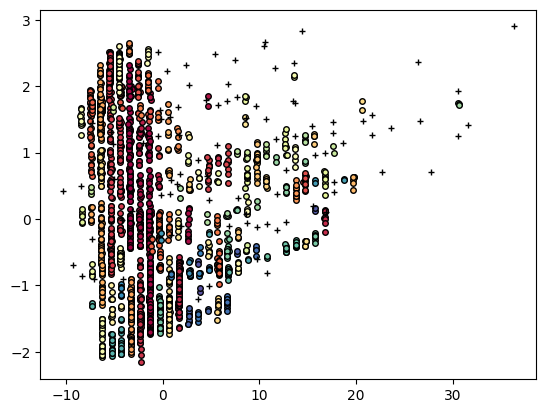

Hyperparameters: [ e: 0.16 , n: 2 ]
V-measure: 0.286
Silhouette score: 0.369


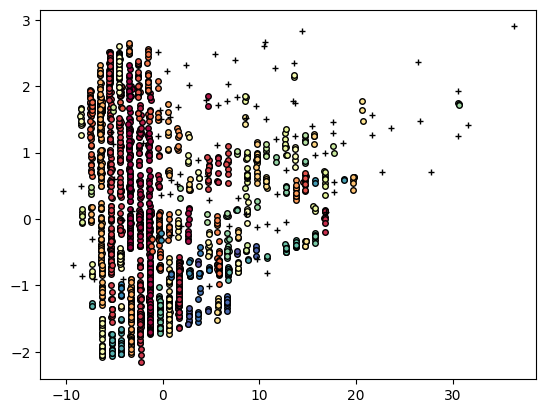

Hyperparameters: [ e: 0.17 , n: 2 ]
V-measure: 0.285
Silhouette score: 0.420


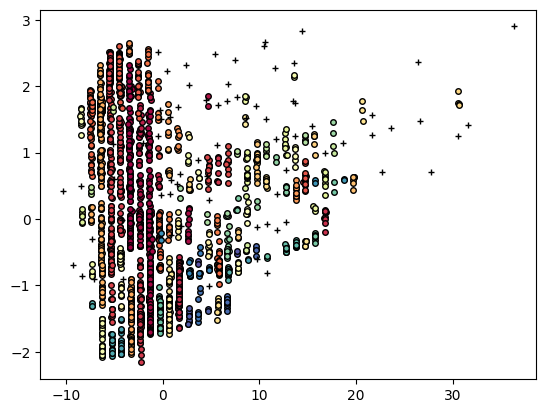

Hyperparameters: [ e: 0.18 , n: 2 ]
V-measure: 0.274
Silhouette score: 0.400


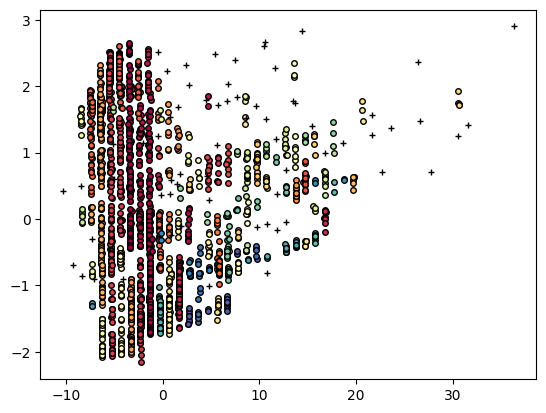

Hyperparameters: [ e: 0.19 , n: 2 ]
V-measure: 0.263
Silhouette score: 0.380


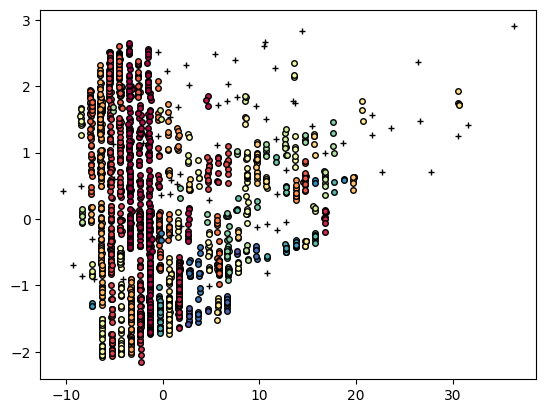

In [ ]:
# DBSCAN 하이퍼 파라미터 튜닝
for i in range(1, 20):
    epsilon = round(i * 0.01, 2)
    no_of_sample = 2
    print("Hyperparameters: [ e:", epsilon , ", n:",no_of_sample, "]")
    try:
        db = DBSCAN(eps = epsilon, min_samples = no_of_sample).fit(X)
        core_mask = np.zeros_like(db.labels_, dtype = bool)
        core_mask[db.core_sample_indices_] = True
        labels = db.labels_
        print("V-measure: %0.3f" % metrics.v_measure_score(labels_true, labels))
        print("Silhouette score: %0.3f" % metrics.silhouette_score(X, labels))
    except:
        pass
        
    unique_labels = set(labels)
    colors = [plt.cm.Spectral(each)
              for each in np.linspace(0, 1, len(unique_labels))]
    for k, col in zip(unique_labels, colors):
        if k == -1:
            col = [0, 0, 0, 1]
        class_member_mask = (labels == k)

        # Core sample 표시
        xy = X[class_member_mask & core_mask]
        plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
                 markeredgecolor='k', markersize=4)

        # Noise sample 표시
        xy = X[class_member_mask & ~core_mask]
        plt.plot(xy[:, 0], xy[:, 1], '+', markerfacecolor=tuple(col),
                 markeredgecolor='k', markersize=5)
    plt.show()

In [ ]:
# sdscaled_data에서 X와 Class 추출
X = mMscaled_data[['X', 'Y']].values
labels_true = mMscaled_data['Class'].values

Hyperparameters: [ e: 0.03 , n: 10 ]
V-measure: 0.586
Silhouette score: 0.429


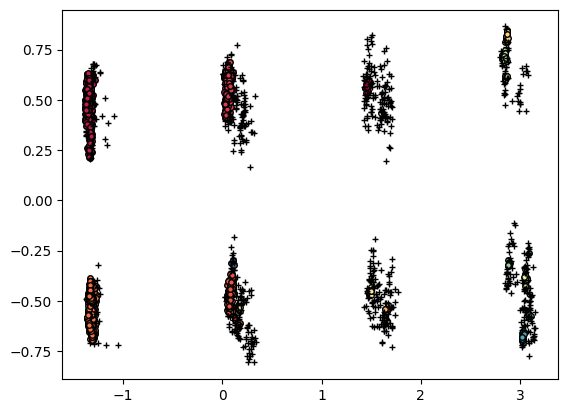

Hyperparameters: [ e: 0.06 , n: 10 ]
V-measure: 0.730
Silhouette score: 0.779


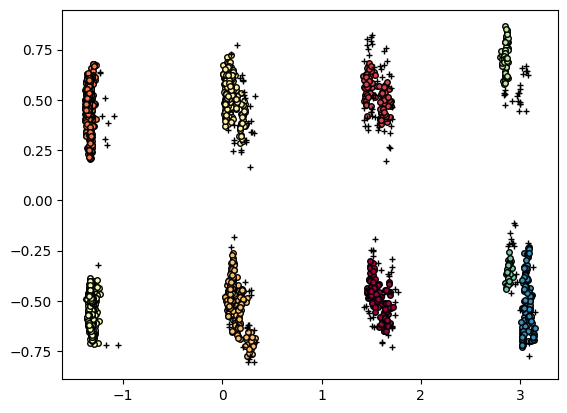

Hyperparameters: [ e: 0.09 , n: 10 ]
V-measure: 0.772
Silhouette score: 0.856


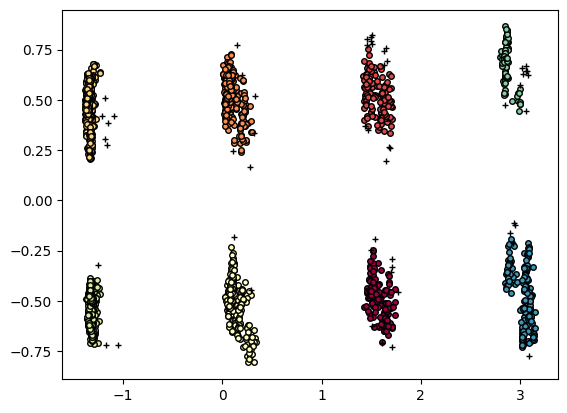

Hyperparameters: [ e: 0.12 , n: 10 ]
V-measure: 0.780
Silhouette score: 0.863


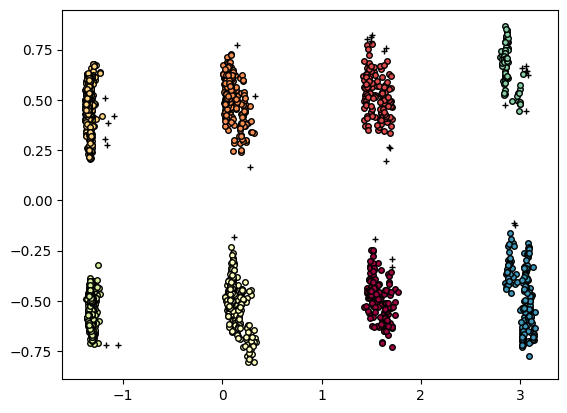

Hyperparameters: [ e: 0.15 , n: 10 ]
V-measure: 0.784
Silhouette score: 0.866


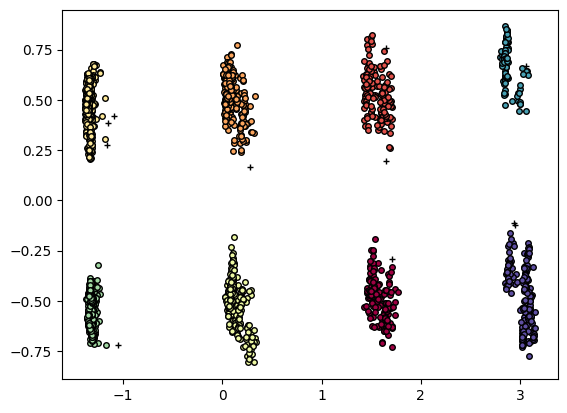

Hyperparameters: [ e: 0.18 , n: 10 ]
V-measure: 0.784
Silhouette score: 0.866


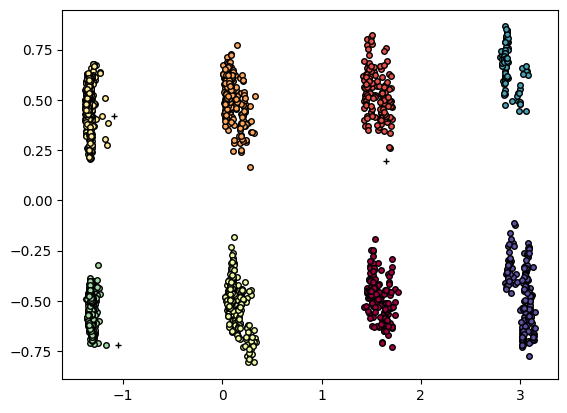

Hyperparameters: [ e: 0.21 , n: 10 ]
V-measure: 0.784
Silhouette score: 0.866


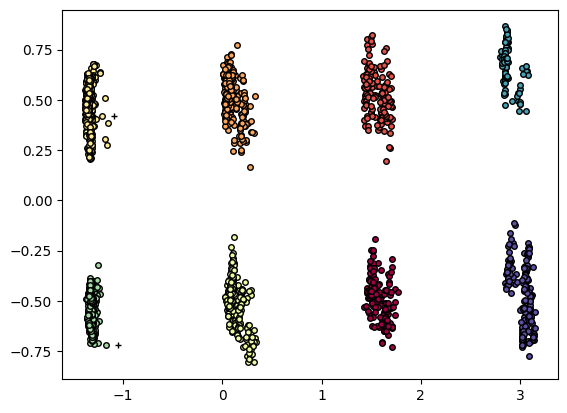

Hyperparameters: [ e: 0.24 , n: 10 ]
V-measure: 0.784
Silhouette score: 0.866


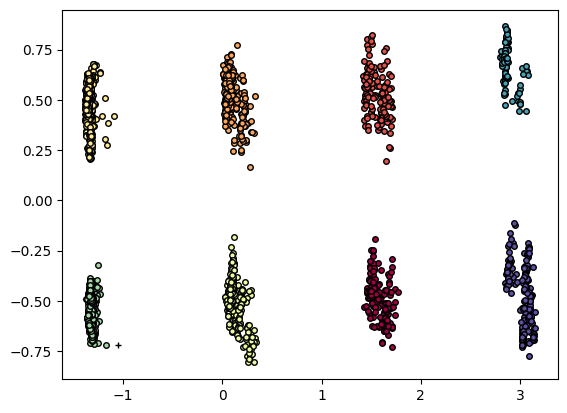

Hyperparameters: [ e: 0.27 , n: 10 ]
V-measure: 0.784
Silhouette score: 0.866


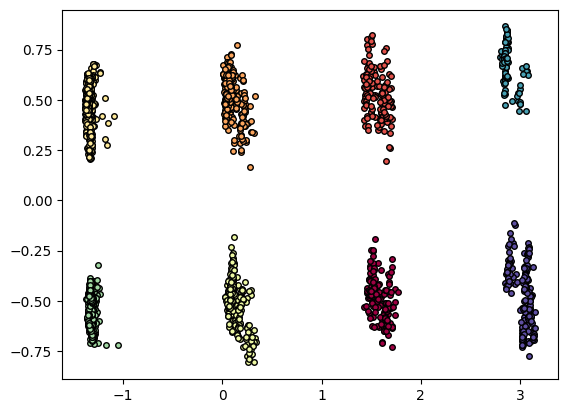

Hyperparameters: [ e: 0.3 , n: 10 ]
V-measure: 0.784
Silhouette score: 0.866


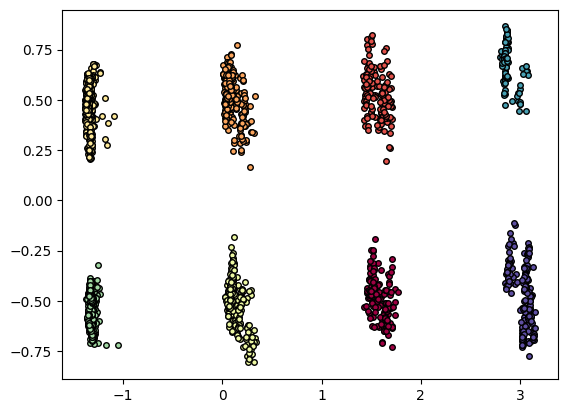

Hyperparameters: [ e: 0.33 , n: 10 ]
V-measure: 0.784
Silhouette score: 0.866


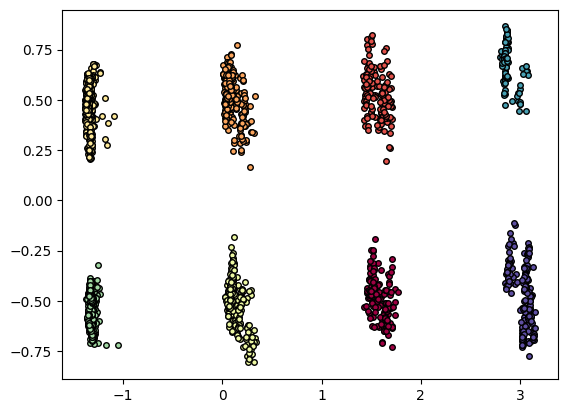

Hyperparameters: [ e: 0.36 , n: 10 ]
V-measure: 0.784
Silhouette score: 0.866


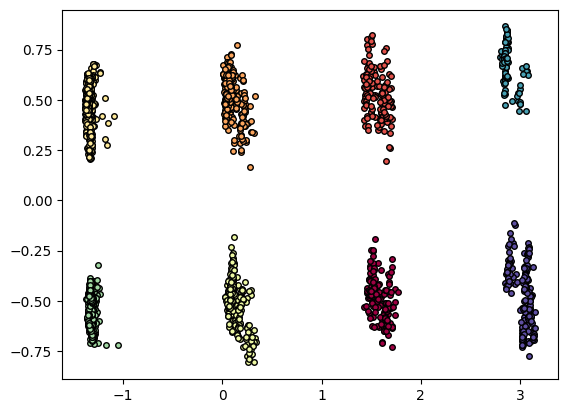

Hyperparameters: [ e: 0.39 , n: 10 ]
V-measure: 0.832
Silhouette score: 0.793


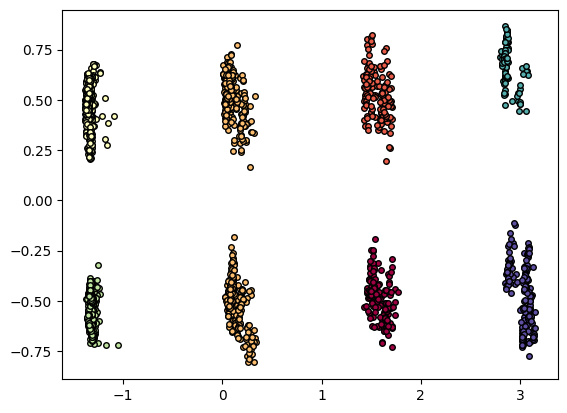

Hyperparameters: [ e: 0.42 , n: 10 ]
V-measure: 0.859
Silhouette score: 0.761


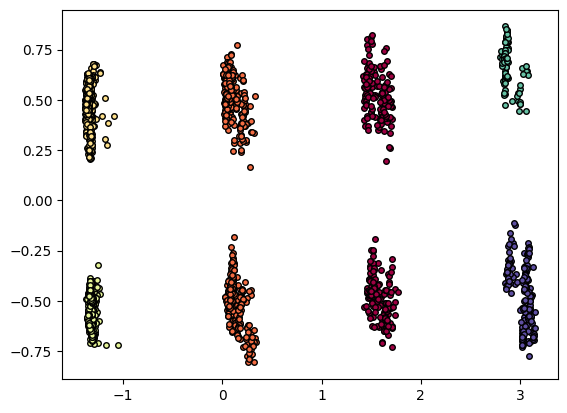

Hyperparameters: [ e: 0.45 , n: 10 ]
V-measure: 0.859
Silhouette score: 0.761


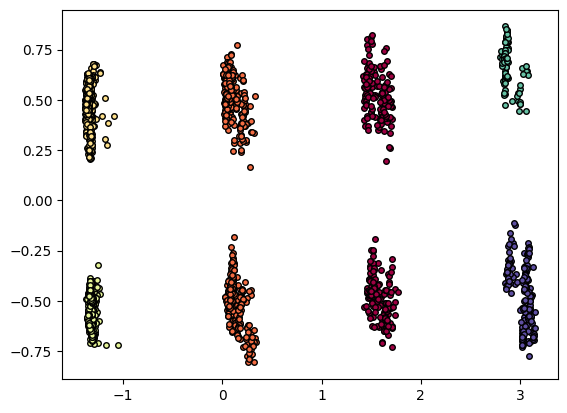

Hyperparameters: [ e: 0.48 , n: 10 ]
V-measure: 0.859
Silhouette score: 0.761


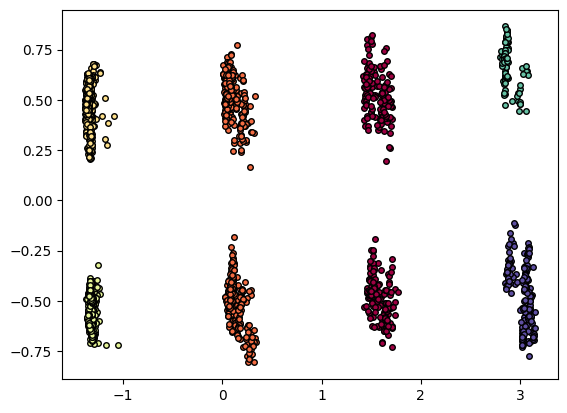

Hyperparameters: [ e: 0.51 , n: 10 ]
V-measure: 0.859
Silhouette score: 0.761


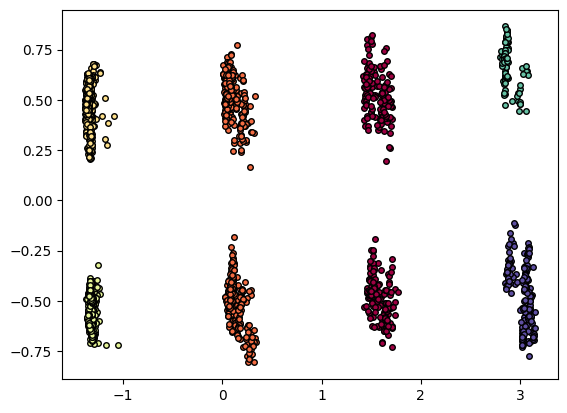

Hyperparameters: [ e: 0.54 , n: 10 ]
V-measure: 0.967
Silhouette score: 0.654


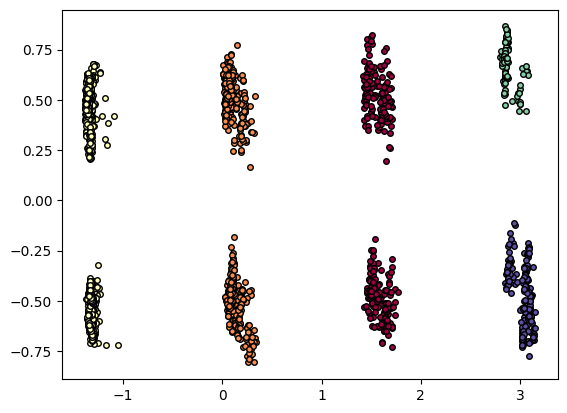

Hyperparameters: [ e: 0.57 , n: 10 ]
V-measure: 1.000
Silhouette score: 0.629


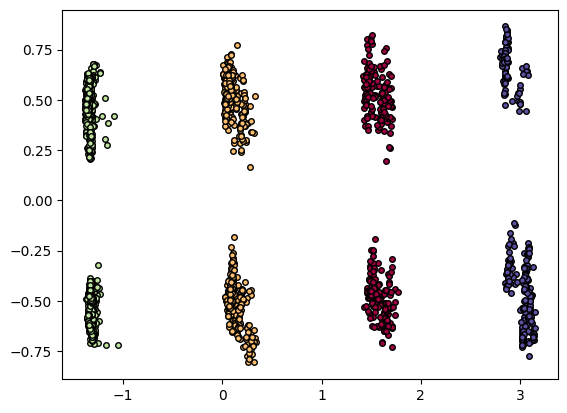

Hyperparameters: [ e: 0.6 , n: 10 ]
V-measure: 1.000
Silhouette score: 0.629


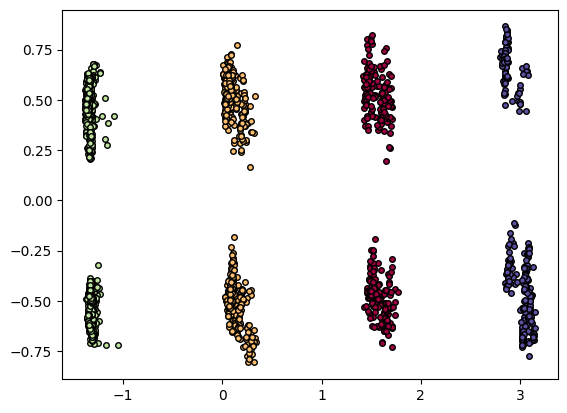

Hyperparameters: [ e: 0.63 , n: 10 ]
V-measure: 1.000
Silhouette score: 0.629


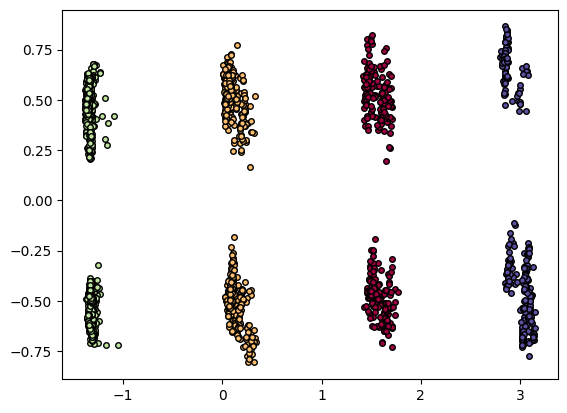

Hyperparameters: [ e: 0.66 , n: 10 ]
V-measure: 1.000
Silhouette score: 0.629


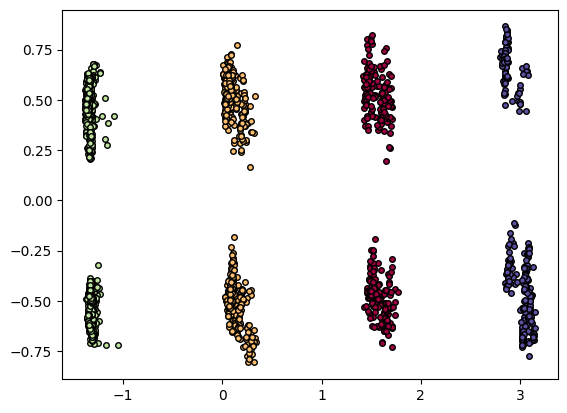

Hyperparameters: [ e: 0.69 , n: 10 ]
V-measure: 1.000
Silhouette score: 0.629


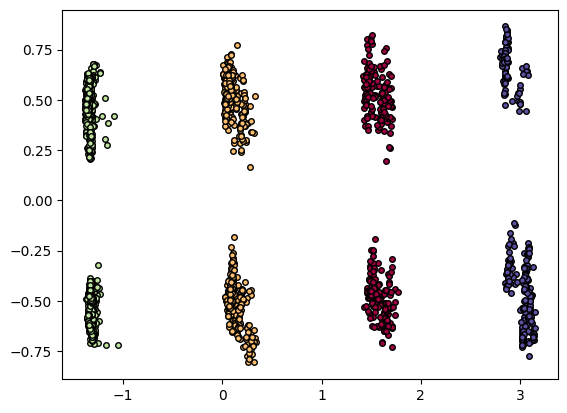

Hyperparameters: [ e: 0.72 , n: 10 ]
V-measure: 1.000
Silhouette score: 0.629


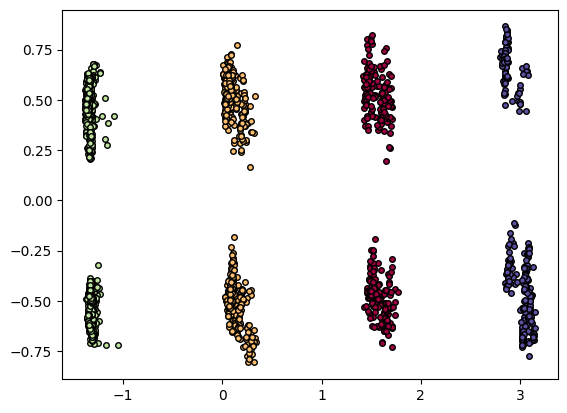

Hyperparameters: [ e: 0.75 , n: 10 ]
V-measure: 1.000
Silhouette score: 0.629


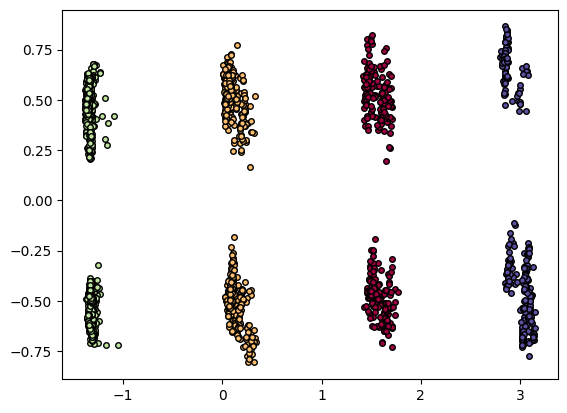

Hyperparameters: [ e: 0.78 , n: 10 ]
V-measure: 1.000
Silhouette score: 0.629


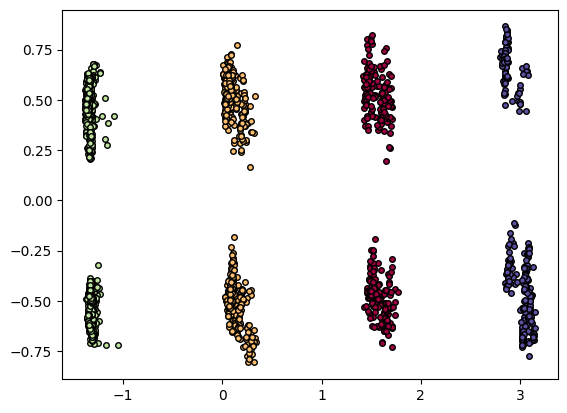

Hyperparameters: [ e: 0.81 , n: 10 ]
V-measure: 1.000
Silhouette score: 0.629


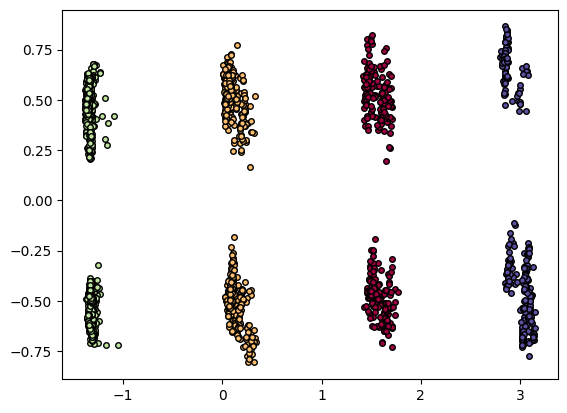

Hyperparameters: [ e: 0.84 , n: 10 ]
V-measure: 1.000
Silhouette score: 0.629


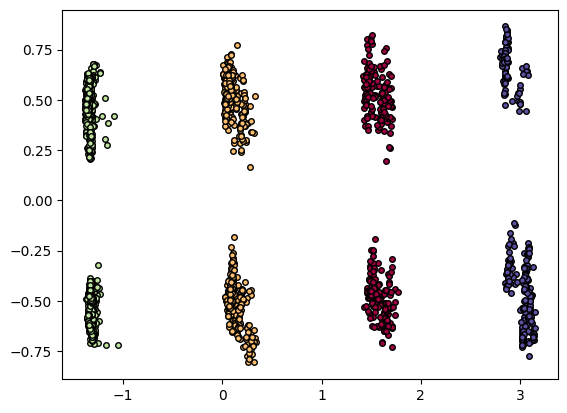

Hyperparameters: [ e: 0.87 , n: 10 ]
V-measure: 1.000
Silhouette score: 0.629


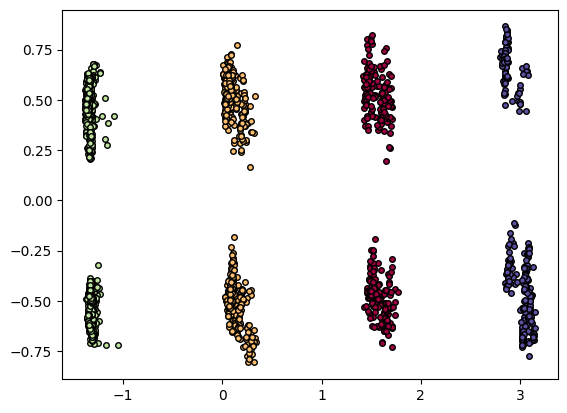

In [ ]:
# DBSCAN 하이퍼 파라미터 튜닝
for i in range(1, 30):
    epsilon = round(i * 0.03, 2)
    no_of_sample = 10
    print("Hyperparameters: [ e:", epsilon , ", n:",no_of_sample, "]")
    try:
        db = DBSCAN(eps = epsilon, min_samples = no_of_sample).fit(X)
        core_mask = np.zeros_like(db.labels_, dtype = bool)
        core_mask[db.core_sample_indices_] = True
        labels = db.labels_
        print("V-measure: %0.3f" % metrics.v_measure_score(labels_true, labels))
        print("Silhouette score: %0.3f" % metrics.silhouette_score(X, labels))
    except:
        pass
        
    unique_labels = set(labels)
    colors = [plt.cm.Spectral(each)
              for each in np.linspace(0, 1, len(unique_labels))]
    for k, col in zip(unique_labels, colors):
        if k == -1:
            col = [0, 0, 0, 1]
        class_member_mask = (labels == k)

        # Core sample 표시
        xy = X[class_member_mask & core_mask]
        plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
                 markeredgecolor='k', markersize=4)

        # Noise sample 표시
        xy = X[class_member_mask & ~core_mask]
        plt.plot(xy[:, 0], xy[:, 1], '+', markerfacecolor=tuple(col),
                 markeredgecolor='k', markersize=5)
    plt.show()

In [ ]:
# sdscaled_data에서 X와 Class 추출
X = robust_data[['X', 'Y']].values
labels_true = robust_data['Class'].values

Hyperparameters: [ e: 0.03 , n: 10 ]
V-measure: 0.077
Silhouette score: -0.206


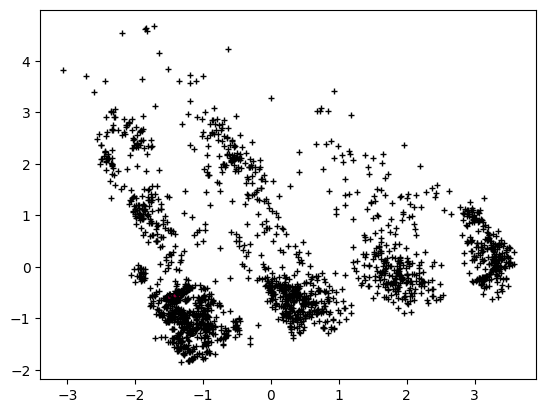

Hyperparameters: [ e: 0.06 , n: 10 ]
V-measure: 0.262
Silhouette score: -0.286


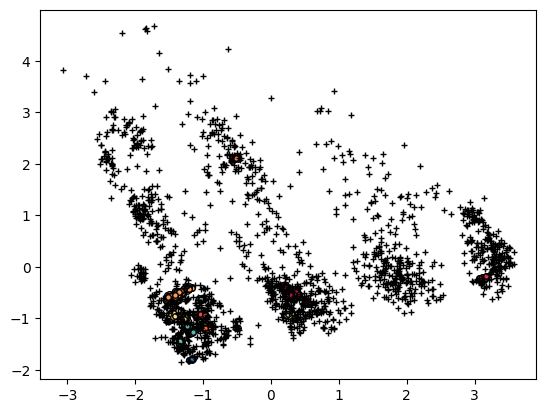

Hyperparameters: [ e: 0.09 , n: 10 ]
V-measure: 0.481
Silhouette score: -0.058


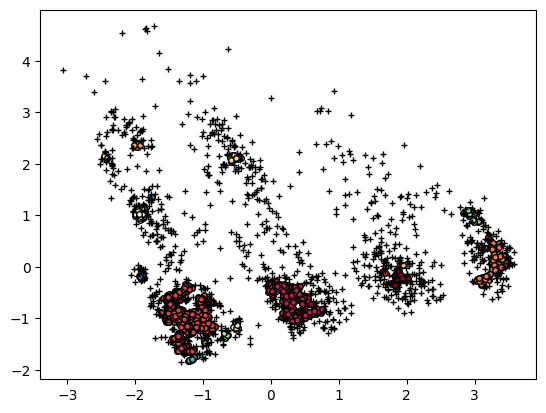

Hyperparameters: [ e: 0.12 , n: 10 ]
V-measure: 0.596
Silhouette score: 0.134


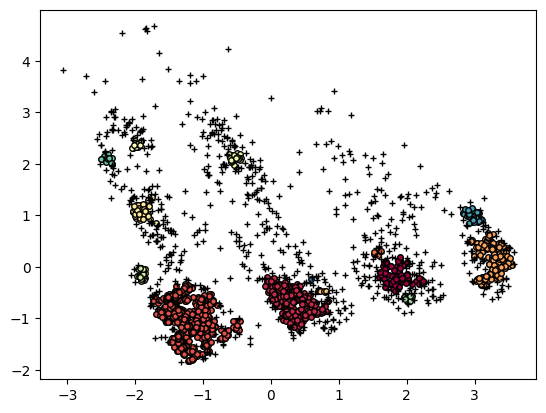

Hyperparameters: [ e: 0.15 , n: 10 ]
V-measure: 0.655
Silhouette score: 0.278


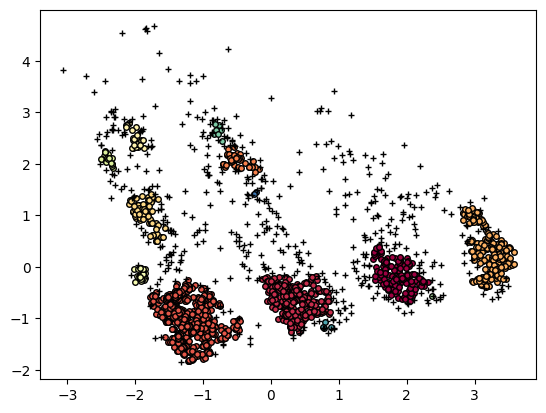

Hyperparameters: [ e: 0.18 , n: 10 ]
V-measure: 0.709
Silhouette score: 0.418


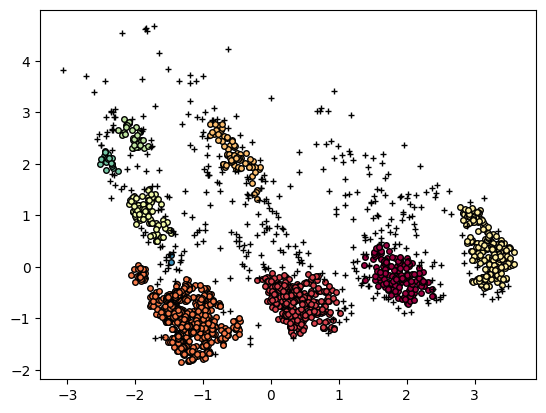

Hyperparameters: [ e: 0.21 , n: 10 ]
V-measure: 0.725
Silhouette score: 0.465


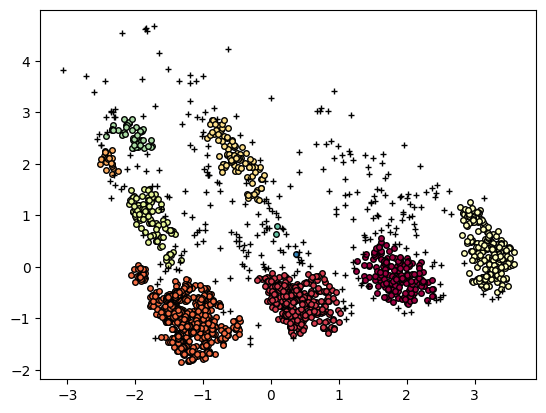

Hyperparameters: [ e: 0.24 , n: 10 ]
V-measure: 0.790
Silhouette score: 0.407


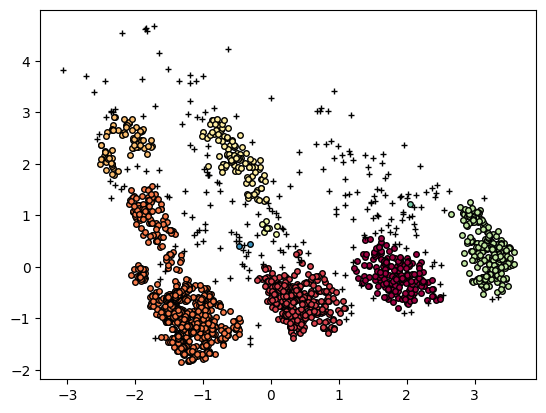

Hyperparameters: [ e: 0.27 , n: 10 ]
V-measure: 0.813
Silhouette score: 0.407


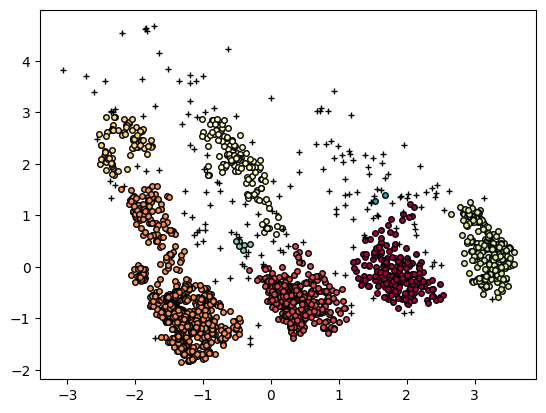

Hyperparameters: [ e: 0.3 , n: 10 ]
V-measure: 0.814
Silhouette score: 0.362


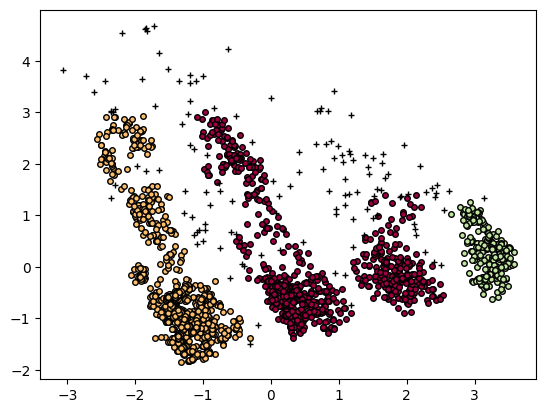

Hyperparameters: [ e: 0.33 , n: 10 ]
V-measure: 0.425
Silhouette score: 0.327


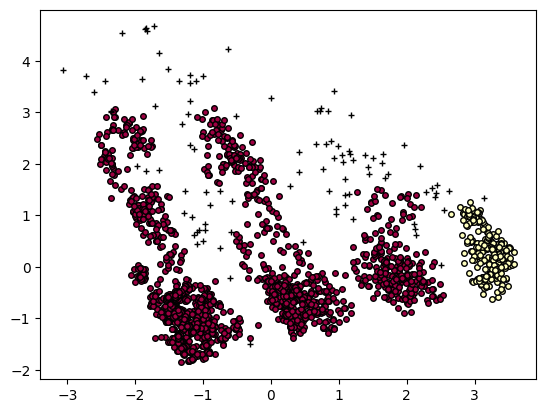

Hyperparameters: [ e: 0.36 , n: 10 ]
V-measure: 0.032
Silhouette score: 0.161


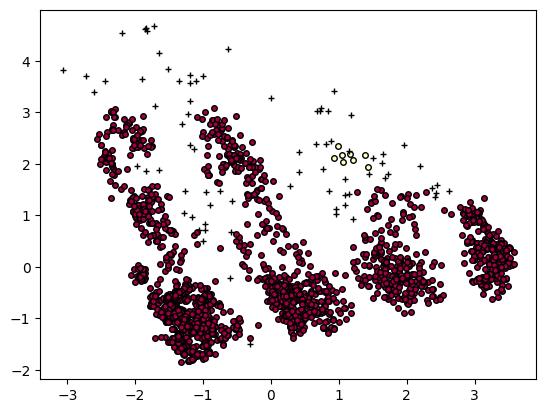

Hyperparameters: [ e: 0.39 , n: 10 ]
V-measure: 0.007
Silhouette score: 0.382


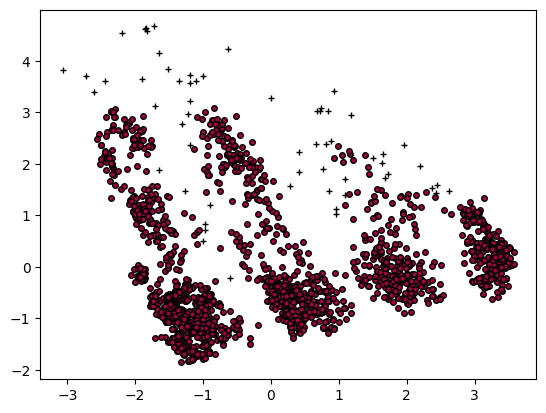

Hyperparameters: [ e: 0.42 , n: 10 ]
V-measure: 0.006
Silhouette score: 0.389


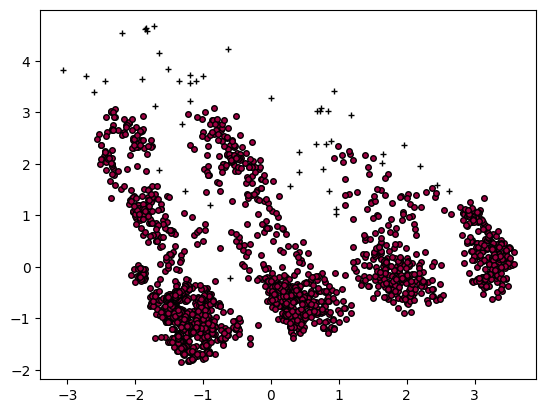

Hyperparameters: [ e: 0.45 , n: 10 ]
V-measure: 0.007
Silhouette score: 0.393


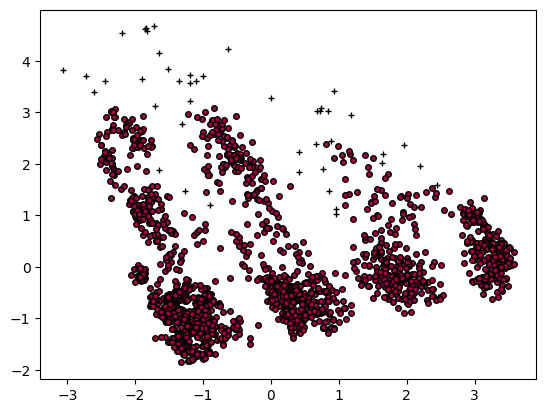

Hyperparameters: [ e: 0.48 , n: 10 ]
V-measure: 0.008
Silhouette score: 0.403


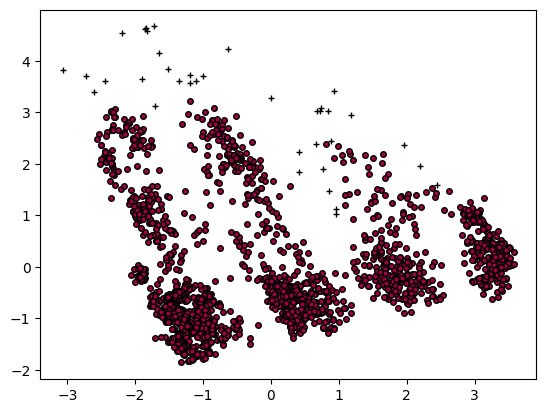

Hyperparameters: [ e: 0.51 , n: 10 ]
V-measure: 0.007
Silhouette score: 0.404


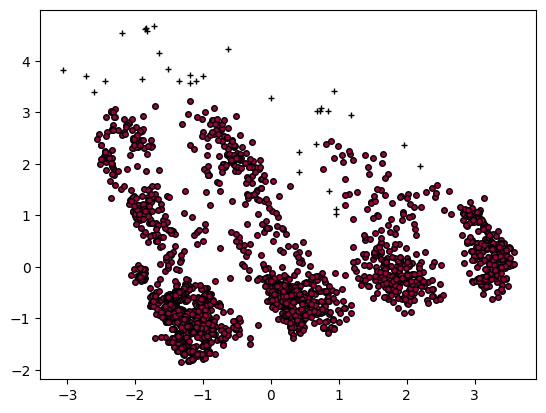

Hyperparameters: [ e: 0.54 , n: 10 ]
V-measure: 0.007
Silhouette score: 0.405


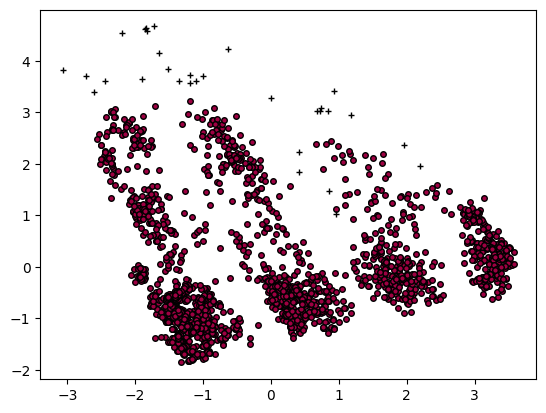

Hyperparameters: [ e: 0.57 , n: 10 ]
V-measure: 0.009
Silhouette score: 0.400


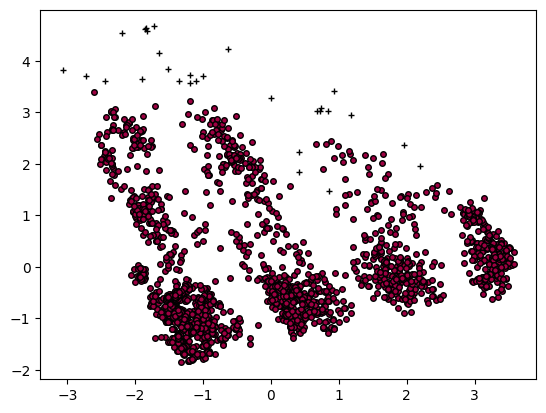

In [ ]:
# DBSCAN 하이퍼 파라미터 튜닝
for i in range(1, 20):
    epsilon = round(i * 0.03, 2)
    no_of_sample = 10
    print("Hyperparameters: [ e:", epsilon , ", n:",no_of_sample, "]")
    try:
        db = DBSCAN(eps = epsilon, min_samples = no_of_sample).fit(X)
        core_mask = np.zeros_like(db.labels_, dtype = bool)
        core_mask[db.core_sample_indices_] = True
        labels = db.labels_
        print("V-measure: %0.3f" % metrics.v_measure_score(labels_true, labels))
        print("Silhouette score: %0.3f" % metrics.silhouette_score(X, labels))
    except:
        pass
        
    unique_labels = set(labels)
    colors = [plt.cm.Spectral(each)
              for each in np.linspace(0, 1, len(unique_labels))]
    for k, col in zip(unique_labels, colors):
        if k == -1:
            col = [0, 0, 0, 1]
        class_member_mask = (labels == k)

        # Core sample 표시
        xy = X[class_member_mask & core_mask]
        plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
                 markeredgecolor='k', markersize=4)

        # Noise sample 표시
        xy = X[class_member_mask & ~core_mask]
        plt.plot(xy[:, 0], xy[:, 1], '+', markerfacecolor=tuple(col),
                 markeredgecolor='k', markersize=5)
    plt.show()

# Data Load

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/ML/online_shoppers_intention.csv')

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12330 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  12330 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12330 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  int64  
 12  Browser                  12330 non-null  int64  
 13  Region                   12330 non-null  int64  
 14  TrafficType           

In [ ]:
data.tail(5)

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4,6,1,1,Returning_Visitor,True,False
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3,2,1,8,Returning_Visitor,True,False
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3,2,1,13,Returning_Visitor,True,False
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,Nov,2,2,3,11,Returning_Visitor,False,False
12329,0,0.0,0,0.0,3,21.250000,0.000000,0.066667,0.000000,0.0,Nov,3,2,1,2,New_Visitor,True,False


In [ ]:
data.isnull().sum()

Administrative             0
Administrative_Duration    0
Informational              0
Informational_Duration     0
ProductRelated             0
ProductRelated_Duration    0
BounceRates                0
ExitRates                  0
PageValues                 0
SpecialDay                 0
Month                      0
OperatingSystems           0
Browser                    0
Region                     0
TrafficType                0
VisitorType                0
Weekend                    0
Revenue                    0
dtype: int64

In [ ]:
# 데이터 중복
dup_data = data[data.duplicated()]
print(dup_data.shape)

(125, 18)


In [ ]:
# 중복 제거
data = data.drop_duplicates()
data = data.reset_index(drop=True)
data

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3,3,1,4,Returning_Visitor,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12200,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4,6,1,1,Returning_Visitor,True,False
12201,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3,2,1,8,Returning_Visitor,True,False
12202,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3,2,1,13,Returning_Visitor,True,False
12203,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,Nov,2,2,3,11,Returning_Visitor,False,False


In [ ]:
data.describe(include='all')

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
count,12205.000000,12205.000000,12205.000000,12205.000000,12205.000000,12205.000000,12205.000000,12205.000000,12205.000000,12205.000000,12205.000000,12205.000000,12205.000000,12205.000000,12205.000000,12205.000000,12205,12205
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,2
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9346,10297
mean,2.338878,81.646331,0.508726,34.825454,32.045637,1206.982457,0.020370,0.041466,5.949574,0.061942,7.667431,2.124211,2.357804,3.153298,4.073904,1.715936,NaN,NaN
std,3.330436,177.491845,1.275617,141.424807,44.593649,1919.601400,0.045255,0.046163,18.653671,0.199666,3.386705,0.906823,1.710114,2.402340,4.016654,0.693425,NaN,NaN
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,1.000000,1.000000,1.000000,1.000000,0.000000,NaN,NaN
25%,0.000000,0.000000,0.000000,0.000000,8.000000,193.000000,0.000000,0.014231,0.000000,0.000000,5.000000,2.000000,2.000000,1.000000,2.000000,2.000000,NaN,NaN
50%,1.000000,9.000000,0.000000,0.000000,18.000000,608.942857,0.002899,0.025000,0.000000,0.000000,8.000000,2.000000,2.000000,3.000000,2.000000,2.000000,NaN,NaN
75%,4.000000,94.700000,0.000000,0.000000,38.000000,1477.154762,0.016667,0.048529,0.000000,0.000000,11.000000,3.000000,2.000000,4.000000,4.000000,2.000000,NaN,NaN


In [ ]:
data['Month'].unique()

array(['Feb', 'Mar', 'May', 'Oct', 'June', 'Jul', 'Aug', 'Nov', 'Sep',
       'Dec'], dtype=object)

In [ ]:
data['VisitorType'].unique()

array(['Returning_Visitor', 'New_Visitor', 'Other'], dtype=object)

In [ ]:
data['Weekend'].unique()

array([False,  True])

In [ ]:
data['Revenue'].unique()

array([False,  True])

In [ ]:
month_dict = {
    'Feb': 2,
    'Mar': 3,
    'May': 5,
    'June': 6,
    'Jul': 7,
    'Aug': 8,
    'Sep': 9,
    'Oct': 10,
    'Nov': 11,
    'Dec': 12
}
data['Month'] = data['Month'].map(month_dict)

In [ ]:
le = LabelEncoder()
data['VisitorType'] = le.fit_transform(data['VisitorType'])

In [ ]:
data['Weekend'] = data['Weekend'].map({True: 1, False: 0})
data['Revenue'] = data['Revenue'].map({True: 1, False: 0})

In [ ]:
for col in data.columns:
    print(f'{col} : {data[col].nunique()}')

Administrative : 20
Administrative_Duration : 2185
Informational : 14
Informational_Duration : 827
ProductRelated : 150
ProductRelated_Duration : 7510
BounceRates : 1041
ExitRates : 3268
PageValues : 1908
SpecialDay : 6
Month : 10
OperatingSystems : 8
Browser : 12
Region : 9
TrafficType : 19
VisitorType : 3
Weekend : 2
Revenue : 2


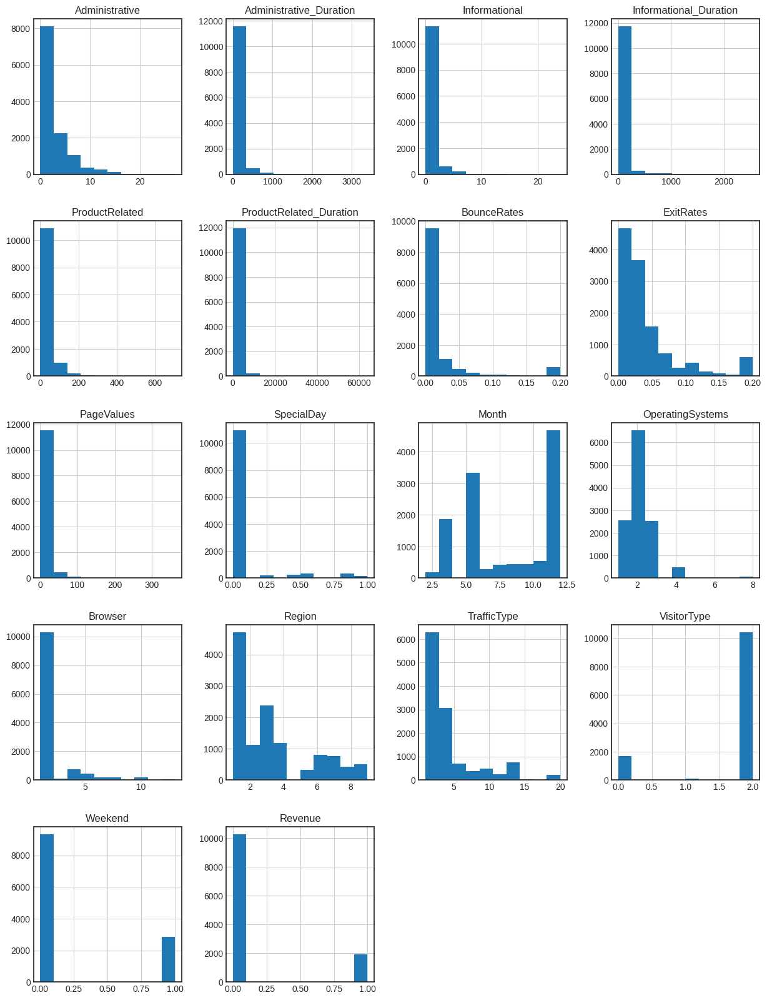

In [ ]:
# 히스토그램 그리기
data.hist(figsize=(15, 20))
plt.show()

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12205 entries, 0 to 12204
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12205 non-null  int64  
 1   Administrative_Duration  12205 non-null  float64
 2   Informational            12205 non-null  int64  
 3   Informational_Duration   12205 non-null  float64
 4   ProductRelated           12205 non-null  int64  
 5   ProductRelated_Duration  12205 non-null  float64
 6   BounceRates              12205 non-null  float64
 7   ExitRates                12205 non-null  float64
 8   PageValues               12205 non-null  float64
 9   SpecialDay               12205 non-null  float64
 10  Month                    12205 non-null  int64  
 11  OperatingSystems         12205 non-null  int64  
 12  Browser                  12205 non-null  int64  
 13  Region                   12205 non-null  int64  
 14  TrafficType           

# 이상치 제거

Text(0.5, 1.0, 'PageValues')

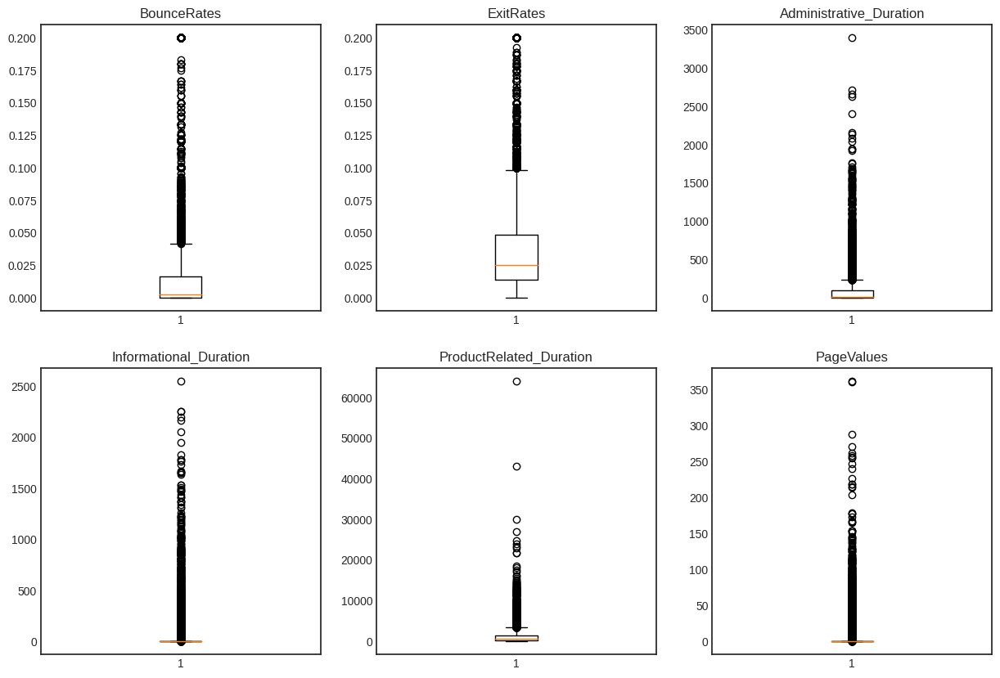

In [ ]:
plt.figure(figsize = (15, 10))
plt.style.use('seaborn-white')
ax=plt.subplot(231)
plt.boxplot(data['BounceRates'])
ax.set_title('BounceRates')
ax=plt.subplot(232)
plt.boxplot(data['ExitRates'])
ax.set_title('ExitRates')
ax=plt.subplot(233)
plt.boxplot(data['Administrative_Duration'])
ax.set_title('Administrative_Duration')
ax=plt.subplot(234)
plt.boxplot(data['Informational_Duration'])
ax.set_title('Informational_Duration')
ax=plt.subplot(235)
plt.boxplot(data['ProductRelated_Duration'])
ax.set_title('ProductRelated_Duration')
ax=plt.subplot(236)
plt.boxplot(data['PageValues'])
ax.set_title('PageValues')

In [ ]:
numerical_features=['BounceRates','ExitRates','Administrative_Duration','ProductRelated_Duration']
for cols in numerical_features:
    Q1 = data[cols].quantile(0.25)
    Q3 = data[cols].quantile(0.75)
    IQR = Q3 - Q1     

    filter = (data[cols] >= Q1 - 1.5 * IQR) & (data[cols] <= Q3 + 1.5 *IQR)
    data=data.loc[filter]

Text(0.5, 1.0, 'ProductRelated_Duration')

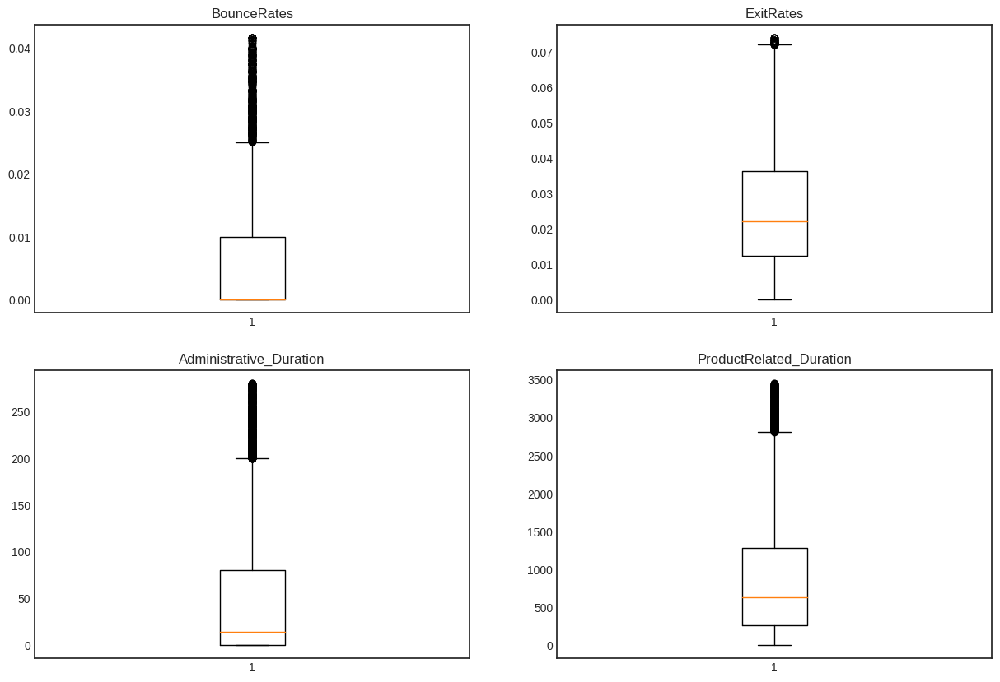

In [ ]:
plt.figure(figsize = (15, 10))
plt.style.use('seaborn-white')
ax=plt.subplot(221)
plt.boxplot(data['BounceRates'])
ax.set_title('BounceRates')
ax=plt.subplot(222)
plt.boxplot(data['ExitRates'])
ax.set_title('ExitRates')
ax=plt.subplot(223)
plt.boxplot(data['Administrative_Duration'])
ax.set_title('Administrative_Duration')
ax=plt.subplot(224)
plt.boxplot(data['ProductRelated_Duration'])
ax.set_title('ProductRelated_Duration')

In [ ]:
data.isnull().sum()

Administrative             0
Administrative_Duration    0
Informational              0
Informational_Duration     0
ProductRelated             0
ProductRelated_Duration    0
BounceRates                0
ExitRates                  0
PageValues                 0
SpecialDay                 0
Month                      0
OperatingSystems           0
Browser                    0
Region                     0
TrafficType                0
VisitorType                0
Weekend                    0
dtype: int64

In [ ]:
# label split
data_label = data['Revenue']
data_label.name = 'Class'  # Class라는 이름으로 저장
data = data.drop('Revenue', axis=1)

# 정규화

In [ ]:
data2 = data.copy()
data3 = data.copy()

In [ ]:
# 스케일링할 컬럼 선택
cols_to_scale = ['Administrative_Duration', 'Informational_Duration', 'ProductRelated_Duration',
                 'BounceRates', 'ExitRates', 'PageValues']

# StandardScaler 객체 생성 후 fit & transform 수행
scaler = StandardScaler()
data[cols_to_scale] = scaler.fit_transform(data[cols_to_scale])

# 데이터 프레임으로 저장
sdscaled_data = data

In [ ]:
# 스케일링할 컬럼 선택
cols_to_scale = ['Administrative_Duration', 'Informational_Duration', 'ProductRelated_Duration',
                 'BounceRates', 'ExitRates', 'PageValues']

# MinMaxScaler 객체 생성 후 fit & transform 수행
mMscaler = MinMaxScaler()
data2[cols_to_scale] = mMscaler.fit_transform(data2[cols_to_scale])

# 데이터 프레임으로 저장
mMscaled_data = data2

In [ ]:
# 스케일링할 컬럼 선택
cols_to_scale = ['Administrative_Duration', 'Informational_Duration', 'ProductRelated_Duration',
                 'BounceRates', 'ExitRates', 'PageValues']

# StandardScaler 객체 생성 후 fit & transform 수행
robust = RobustScaler()
data3[cols_to_scale] = scaler.fit_transform(data3[cols_to_scale])

# 데이터 프레임으로 저장
robust_data = data3

In [ ]:
mMscaled_data.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend
4,0,0.0,0,0.0,10,0.181765,0.480000,0.675000,0.0,0.0,2,3,3,1,4,2,1
5,0,0.0,0,0.0,19,0.044671,0.378947,0.331579,0.0,0.0,2,2,2,1,3,2,0
9,0,0.0,0,0.0,3,0.213773,0.000000,0.300000,0.0,0.4,2,2,4,1,2,2,0
10,0,0.0,0,0.0,3,0.114418,0.000000,0.900000,0.0,0.0,2,1,1,3,3,2,0
11,0,0.0,0,0.0,16,0.118111,0.450000,0.348750,0.0,0.4,2,1,1,4,3,2,0


In [ ]:
robust_data.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend
4,0,-0.72952,0,-0.22868,10,-0.323059,1.427986,1.423224,-0.33104,0.0,2,3,3,1,4,2,1
5,0,-0.72952,0,-0.22868,19,-0.917277,0.990278,-0.078947,-0.33104,0.0,2,2,2,1,3,2,0
9,0,-0.72952,0,-0.22868,3,-0.184324,-0.651127,-0.217078,-0.33104,0.4,2,2,4,1,2,2,0
10,0,-0.72952,0,-0.22868,3,-0.614968,-0.651127,2.407406,-0.33104,0.0,2,1,1,3,3,2,0
11,0,-0.72952,0,-0.22868,16,-0.598960,1.298041,-0.003839,-0.33104,0.4,2,1,1,4,3,2,0


# 의사결정트리

In [ ]:
seed = 2023
x_train, x_test, y_train, y_test = train_test_split(robust_data, data_label, test_size=0.7, random_state=seed)

In [ ]:
x_train.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend
10184,1,-0.581954,0,-0.228680,32,0.493344,-0.651127,-1.171436,3.515041,0.0,12,8,13,9,20,1,0
11345,3,0.222284,0,-0.228680,17,-0.772306,-0.651127,-1.310613,-0.331040,0.0,11,2,2,1,2,2,0
6770,4,0.403791,0,-0.228680,59,1.463287,0.394225,-0.210253,-0.331040,0.0,7,2,6,2,7,2,0
347,2,0.214906,0,-0.228680,15,-0.400693,-0.651127,-1.160252,-0.331040,0.0,3,2,2,1,1,0,0
6483,14,3.118072,3,1.383923,51,2.557613,0.769032,0.235753,0.079514,0.0,11,4,2,7,1,2,1


In [ ]:
dt_clf = DecisionTreeClassifier(random_state=seed)
dt_clf.fit(x_train, y_train) # 학습

DecisionTreeClassifier(random_state=2023)

In [ ]:
# export_graphviz( )의 호출 결과로 out_file로 지정된 tree.dot 파일을 생성
export_graphviz(dt_clf, out_file="tree.dot", class_names = ['False','True'], feature_names = list(data.columns), impurity=True, filled=True)

In [ ]:
print('[ max_depth의 제약이 없는 경우의 Decision Tree 시각화 ]')
# 위에서 생성된 tree.dot 파일을 Graphiviz 가 읽어서 시각화
with open("tree.dot") as f:
    dot_graph = f.read()
graph = graphviz.Source(dot_graph)
graph.render(filename='tree', format='png', view=True)

[ max_depth의 제약이 없는 경우의 Decision Tree 시각화 ]


'tree.png'

In [ ]:
y_pred = dt_clf.predict(x_test)

In [ ]:
# 학습결과 평가
print("Train_Accuracy : ", dt_clf.score(x_train, y_train), '\n')
print("Test_Accuracy : ", dt_clf.score(x_test, y_test), '\n')

def print_pred_result(y_test, y_pred):
    accuracy = mt.accuracy_score(y_test, y_pred)
    recall = mt.recall_score(y_test, y_pred, average='macro')
    precision = mt.precision_score(y_test, y_pred, average='macro')
    f1_score = mt.f1_score(y_test, y_pred, average='macro')
    matrix = mt.confusion_matrix(y_test, y_pred)

    print('Accuracy: ', format(accuracy,'.2f'),'\n')
    print('Recall: ', format(recall,'.2f'),'\n')        # 맞춘거
    print('Precision: ', format(precision,'.2f'),'\n')  # 예측
    print('F1_score: ', format(f1_score,'.2f'),'\n')
    print('Confusion Matrix:','\n', matrix)
print_pred_result(y_test, y_pred)

Train_Accuracy :  1.0 

Test_Accuracy :  0.8525044868657203 

Accuracy:  0.85 

Recall:  0.76 

Precision:  0.73 

F1_score:  0.75 

Confusion Matrix: 
 [[4594  532]
 [ 372  631]]


# 교차검증

In [ ]:
# 교차검증

x = robust_data
y = data_label

# 각 폴드의 스코어 
scores = cross_val_score(dt_clf, x, y, cv = 10)

print('Averaged results of cross validation: ', scores.mean())

pd.DataFrame(cross_validate(dt_clf, x, y, cv =10))

Averaged results of cross validation:  0.8473778212654925


,fit_time,score_time,test_score
0,0.215790,0.004272,0.901826
1,0.219118,0.029097,0.909817
2,0.295128,0.009781,0.907534
3,0.158617,0.016709,0.864155
4,0.210471,0.013481,0.860731
5,0.255982,0.004308,0.796571
6,0.253515,0.013299,0.787429
7,0.219036,0.013783,0.826286
8,0.172849,0.011884,0.829714
9,0.135571,0.004303,0.789714


In [ ]:
# test set에 대한 스코어(정확도)
print(f'정확도 : {dt_clf.score(x_test, y_test):.3f}')

정확도 : 0.853


# 가지치기 수행

In [ ]:
# 최적화
pruned_dt_clf = DecisionTreeClassifier(random_state=seed)
pa = {'splitter' : ['best', 'random'],
      'max_depth' : [3, 4, 5, 6, 7, 8],
      'min_samples_split' : [2, 3, 4, 5, 6, 7, 8]}

dt_grid = GridSearchCV(pruned_dt_clf, param_grid=pa, cv=10)
dt_grid.fit(x_train, y_train)

result = pd.DataFrame(dt_grid.cv_results_['params'])
result['mean_test_score'] = dt_grid.cv_results_['mean_test_score']
result.sort_values(by='mean_test_score', ascending=False)

,max_depth,min_samples_split,splitter,mean_test_score
16,4,3,best,0.891858
26,4,8,best,0.891858
24,4,7,best,0.891858
22,4,6,best,0.891858
20,4,5,best,0.891858
...,...,...,...,...
76,8,5,best,0.872809
82,8,8,best,0.872806
64,7,6,best,0.872805
66,7,7,best,0.872802


In [ ]:
pruned_dt_clf = DecisionTreeClassifier(max_depth=4, min_samples_split=3, random_state=seed)
pruned_dt_clf.fit(x_train, y_train)

y_pred = pruned_dt_clf.predict(x_test)

print(f"Accuracy of training set: {pruned_dt_clf.score(x_train, y_train):.3f}")
print(f"Accuracy of test set: {pruned_dt_clf.score(x_test, y_test):.3f}")
print_pred_result(y_test, y_pred)

Accuracy of training set: 0.907
Accuracy of test set: 0.891
Accuracy:  0.89 

Recall:  0.76 

Precision:  0.82 

F1_score:  0.78 

Confusion Matrix: 
 [[4901  225]
 [ 442  561]]


<Axes: >

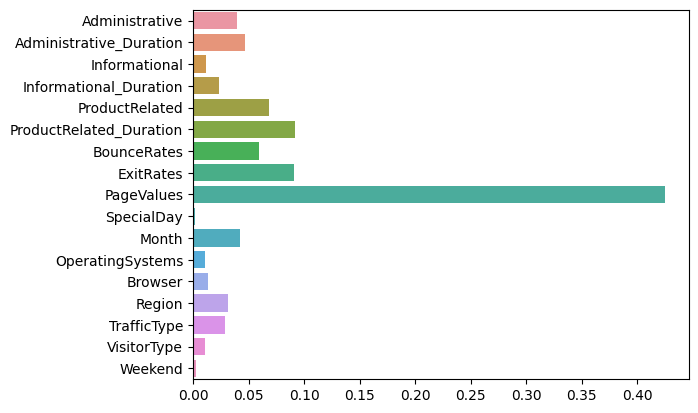

In [ ]:
sns.barplot(x=dt_clf.feature_importances_, y=dt_clf.feature_names_in_)

<Axes: >

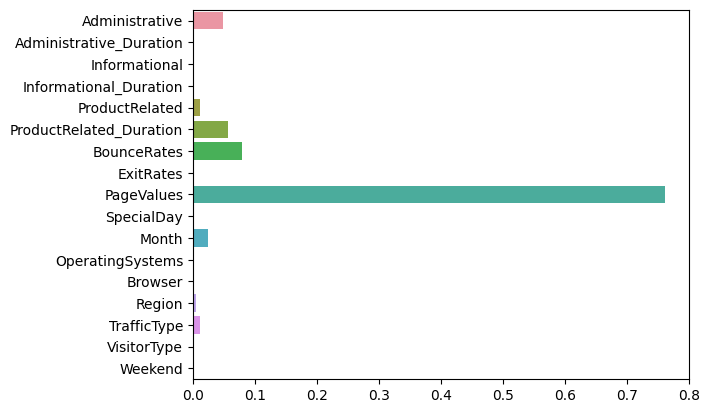

In [ ]:
sns.barplot(x=pruned_dt_clf.feature_importances_, y=pruned_dt_clf.feature_names_in_)

In [ ]:
# export_graphviz( )의 호출 결과로 out_file로 지정된 tree.dot 파일을 생성함
export_graphviz(pruned_dt_clf, out_file="prunedtree.dot", class_names = ['False','True'], feature_names = list(data.columns), impurity=True, filled=True)

In [ ]:
print('[ max_depth가 4인 경우의 Decision Tree 시각화 ]')
# 위에서 생성된 tree.dot 파일을 Graphiviz 가 읽어서 시각화
with open("prunedtree.dot") as f:
    dot_graph = f.read()
graph = graphviz.Source(dot_graph)
graph.render(filename='prunedtree', format='png', view=True)

[ max_depth가 4인 경우의 Decision Tree 시각화 ]


'prunedtree.png'